<a href="https://colab.research.google.com/github/MiPf0/PredictingDisasterTweets/blob/main/TransformingDisasterTweets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## Installationen und Importe von Bibliotheken

In [ ]:
# Python-Version zeigen
!python --version

Python 3.10.11


In [ ]:
# Info: mit Google Drive verbinden, da dort die Datensätze liegen
# Code-Quelle: Google
# Link: https://www.google.at/

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Info: Imports und Installationen

# Code-Quellen und Links:

# 1. Import und Installation von Pytorch-Lightning, Numpy, Tqdm.auto, Torch/Torch.nn/Torch.utils.data,
# Transformers.BertTokenizerFast, Torchmetrics, Sklearn.model_selection, Sklearn.metrics
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

# 2. Import und Installation von Tensorflow und Pandas
# Code-Quelle: Chris McCormick and Nick Ryan, "BERT Fine-Tuning Tutorial with PyTorch", 2019
# Link: https://colab.research.google.com/drive/1pTuQhug6Dhl9XalKB0zUGf4FIdYFlpcX or https://mccormickml.com/2019/07/22/BERT-fine-tuning/

# 3. Import und Installation von Sklearn OneHotEncoder
# Code-Quelle: Zach (Statology), "How to Perform One-Hot Encoding in Python", 2021
# Link: https://www.statology.org/one-hot-encoding-in-python/

# 4. Weitere Importe: Sklearn.utils.class_weight, Seaborn, Pylab, Matplotlib, Imblearn.oversampling, Imblearn.undersampling, Time

# Pytorch Lightning
!pip install git+https://github.com/PyTorchLightning/pytorch-lightning --quiet
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger

# Tensorflow und Transformer
import tensorflow as tf
!pip install transformers --quiet
from transformers import BertTokenizerFast as BertTokenizer, BertModel, AdamW, get_linear_schedule_with_warmup
from transformers import AutoModel, AutoTokenizer

# Pandas, Numpy, Seaborn
import pandas as pd
import numpy as np
import seaborn as sns

# Sklearn und Sklearn Utils
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix
from sklearn.utils import class_weight

# Torch und Torchmetrics
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchmetrics import Accuracy, F1Score, AUROC
from torchmetrics.classification import MulticlassAccuracy
from torchmetrics.classification import MulticlassAUROC

# Sonstige
from tqdm.auto import tqdm
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import time

# Konfigurationen
%matplotlib inline
%config InlineBackend.figure_format='retina'
RANDOM_SEED = 42
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))
rcParams['figure.figsize'] = 12, 8
pl.seed_everything(RANDOM_SEED)

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 562.4/562.4 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 7.

INFO:lightning_fabric.utilities.seed:Global seed set to 42


42

In [ ]:
# Info: Test, ob GPU gefunden wurde
# Code-Quelle: Chris McCormick and Nick Ryan, "BERT Fine-Tuning Tutorial with PyTorch", 2019
# Link: https://colab.research.google.com/drive/1pTuQhug6Dhl9XalKB0zUGf4FIdYFlpcX or https://mccormickml.com/2019/07/22/BERT-fine-tuning/

# Abrufen des GPU-Gerätenamens.
device_name = tf.test.gpu_device_name()

# Der Gerätename sollte folgendermaßen aussehen:
if device_name == '/device:GPU:0':
    print('GPU gefunden unter: {}'.format(device_name))
else:
    raise SystemError('GPU-Gerät nicht gefunden')

# Wenn eine GPU verfügbar ist...
if torch.cuda.is_available():    

    # PyTorch informieren, dass es die GPU benutzen soll.    
    device = torch.device("cuda")

    print('Es sind %d GPU(s) verfügbar.' % torch.cuda.device_count())

    print('Wir werden diese GPU verwenden:', torch.cuda.get_device_name(0))

# Falls nicht...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

GPU gefunden unter: /device:GPU:0
Es sind 1 GPU(s) verfügbar.
Wir werden diese GPU verwenden: Tesla V100-SXM2-16GB


## Trainings-, Validierungs- und Test-Datensätze importieren

In [ ]:
# Info: Datensätze in Pandas Datenrahmen laden, Anzahl an Datenpunkten wiedergeben (gleiche Code-Quelle wie in vorheriger Code-Zelle, kleine Anpassungen)

data_path_train_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/train_merged.tsv"
data_path_val_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/dev_merged.tsv"
data_path_test_df = "/content/drive/MyDrive/TransformingDisasterTweets/Data/test_merged.tsv"

# Trainings-Datenrahmen kreieren
train_df = pd.read_csv(data_path_train_df, delimiter='\t')
print('Tweet-Anzahl train_df: {:,}'.format(train_df.shape[0]))
print('Spalten-Anzahl train_df: {:,}\n'.format(train_df.shape[1]))

# Validierungs-Datenrahmen kreieren
val_df = pd.read_csv(data_path_val_df, delimiter='\t')
print('Tweet-Anzahl val_df: {:,}'.format(val_df.shape[0]))
print('Spalten-Anzahl val_df: {:,}\n'.format(val_df.shape[1]))

# Test-Datenrahmen kreieren
test_df = pd.read_csv(data_path_test_df, delimiter='\t')
print('Tweet-Anzahl test_df: {:,}'.format(test_df.shape[0]))
print('Spalten-Anzahl test_df: {:,}'.format(test_df.shape[1]))

Tweet-Anzahl train_df: 53,531
Spalten-Anzahl train_df: 5

Tweet-Anzahl val_df: 7,793
Spalten-Anzahl val_df: 5

Tweet-Anzahl test_df: 15,160
Spalten-Anzahl test_df: 5


# Initiale Daten-Vorverarbeitung

## Datensatz-Erstellung und -Begutachtung

### Auflistung aller Katastrophenarten und humanitären Kategorien

In [ ]:
# Info: Alle verfügbaren Katastrophen-Ereignisarten auflisten
# Code-Quelle: dblilienthal, "Multiclass-Text-Classification-with-DistilBERT-on-COVID-19-Tweets", 2021; etwas angepasst
# Link: https://github.com/dblilienthal/Multiclass-Text-Classification-with-DistilBERT-on-COVID-19-Tweets/blob/main/Multiclass%20Text%20Classification%20with%20DistilBERT%20on%20COVID-19%20Tweets.ipynb

label_in_question = 'event_type_label'

label_dict = (train_df[[label_in_question]].drop_duplicates()
              .sort_values(by=label_in_question)
              .reset_index(drop=True)[label_in_question]
              .to_dict())

print('Folgende Kategorien an Katastrophenarten existieren in den Datensätzen:')

for index, key in label_dict.items():
    print(index, key)

Folgende Kategorien an Katastrophenarten existieren in den Datensätzen:
0 earthquake
1 floods
2 hurricane
3 wildfires


In [ ]:
# Info: Alle verfügbaren humanitären Klassen auflisten (gleiche Code-Quelle wie in vorheriger Code-Zelle, etwas angepasst)

label_in_question = 'class_label'

label_dict = (train_df[[label_in_question]].drop_duplicates()
              .sort_values(by=label_in_question)
              .reset_index(drop=True)[label_in_question]
              .to_dict())

print('Folgende humanitäre Kategorien existieren in den Datensätzen:')

for index, key in label_dict.items():
    print(index, key)

Folgende humanitäre Kategorien existieren in den Datensätzen:
0 caution_and_advice
1 displaced_people_and_evacuations
2 infrastructure_and_utility_damage
3 injured_or_dead_people
4 missing_or_found_people
5 not_humanitarian
6 other_relevant_information
7 requests_or_urgent_needs
8 rescue_volunteering_or_donation_effort
9 sympathy_and_support


In [ ]:
# Info: Train/Dev/Test-Datensätze kombinieren
combined_all = pd.concat([train_df,val_df,test_df])

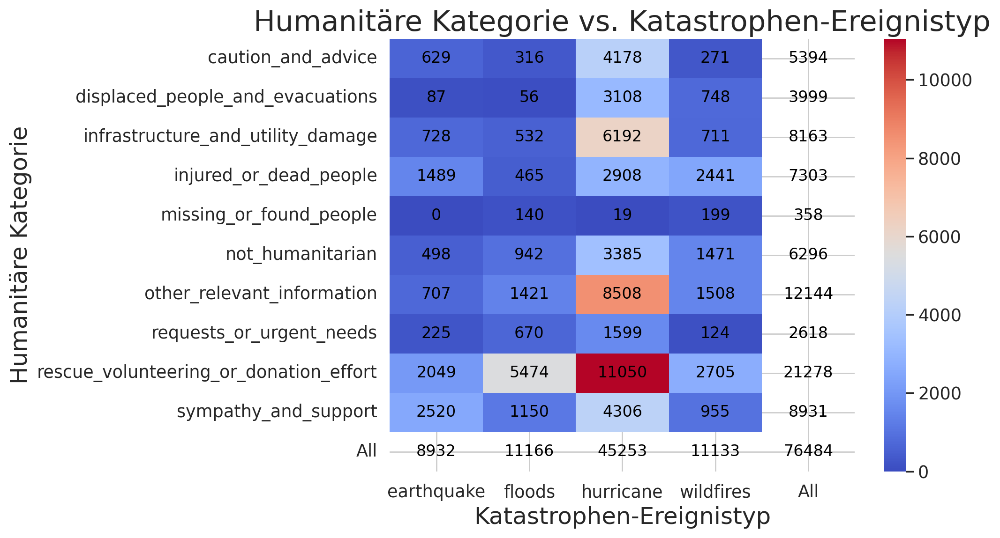

In [ ]:
# Info: Katastrophenereignistyp und humanitäre Kategorien in Beziehung setzen
# Code-Quelle: Seaborn, 2022
# Link: https://seaborn.pydata.org/index.html

# Erstellung einer Pivot-Tabelle
pivot_table = pd.pivot_table(combined_all, values='tweet_text', index=['class_label'], columns=['event_type_label'], aggfunc='count', fill_value=0, margins=True) #margins=True erzeugt 'All' column und row

# Erstellung eines Heatmap Plots mit Maske
fig, ax = plt.subplots(figsize=(8, 6))
mask = np.zeros((11, 5))
mask[:,4] = True
mask[10,:] = True
sns.heatmap(pivot_table, mask=mask, cmap=sns.color_palette("coolwarm", as_cmap=True))
sns.heatmap(pivot_table, alpha=0, cbar=False, annot=True, annot_kws={"size": 12, "color":"black"}, fmt='g')

# Titel- und Achsen-Beschriftung
plt.title('Humanitäre Kategorie vs. Katastrophen-Ereignistyp', fontsize=22)
plt.xlabel('Katastrophen-Ereignistyp', fontsize=18)
plt.ylabel('Humanitäre Kategorie', fontsize=18)

plt.show()

### Erstellung der 18 Teil-Datenrahmen und Begutachtung

In [ ]:
# Info: Teil-Datenrahmen erstellen und unbrauchbare Spalten entfernen
# Code-Quelle: theartificialguy, "Multi Label Text Classification using BERT PyTorch", 2021
# Link: https://github.com/theartificialguy/NLP-with-Deep-Learning/blob/master/BERT/Multi%20Label%20Text%20Classification%20using%20BERT%20PyTorch/bert_multilabel_pytorch_standard.ipynb

def create_disaster_dataframe_with_reindex(df_to_copy, labels_to_drop, labels_to_reindex, filter=False, filter_label=None):
  df_to_work_with = df_to_copy.copy()
  if (filter):
    df_to_work_with = df_to_work_with[df_to_work_with['event_type_label'] == filter_label].reset_index(drop=True)
  df_to_work_with.drop(labels=labels_to_drop, axis=1, inplace=True)
  return df_to_work_with.reindex(columns=labels_to_reindex)

drop_labels_lv1 = ['event_name_label', 'tweet_id', 'class_label']
reindex_labels_lv1 = ['tweet_text', 'event_type_label']

drop_labels_lv2 = ['event_name_label', 'event_type_label', 'tweet_id']
reindex_labels_lv2 = ['tweet_text', 'class_label']

label_equ = 'earthquake'
label_fld = 'floods'
label_hrc = 'hurricane'
label_wfr = 'wildfires'

# Level 1
train_df_lv1 = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv1,reindex_labels_lv1)
val_df_lv1 = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv1,reindex_labels_lv1)
test_df_lv1 = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv1,reindex_labels_lv1)

# Level 2
train_df_lv2 = create_disaster_dataframe_with_reindex(train_df,drop_labels_lv2,reindex_labels_lv2)
val_df_lv2 = create_disaster_dataframe_with_reindex(val_df,drop_labels_lv2,reindex_labels_lv2)
test_df_lv2 = create_disaster_dataframe_with_reindex(test_df,drop_labels_lv2,reindex_labels_lv2)

# Earthquake
train_df_lv2_equ = create_disaster_dataframe_with_reindex(train_df,
                                                          drop_labels_lv2,
                                                          reindex_labels_lv2,
                                                          filter=True,filter_label=label_equ)
val_df_lv2_equ = create_disaster_dataframe_with_reindex(val_df,
                                                        drop_labels_lv2,
                                                        reindex_labels_lv2,
                                                        filter=True,
                                                        filter_label=label_equ)
test_df_lv2_equ = create_disaster_dataframe_with_reindex(test_df,
                                                         drop_labels_lv2,
                                                         reindex_labels_lv2,
                                                         filter=True,
                                                         filter_label=label_equ)

# Floods
train_df_lv2_fld = create_disaster_dataframe_with_reindex(train_df,
                                                          drop_labels_lv2,
                                                          reindex_labels_lv2,
                                                          filter=True,
                                                          filter_label=label_fld)
val_df_lv2_fld = create_disaster_dataframe_with_reindex(val_df,
                                                        drop_labels_lv2,
                                                        reindex_labels_lv2,
                                                        filter=True,
                                                        filter_label=label_fld)
test_df_lv2_fld = create_disaster_dataframe_with_reindex(test_df,
                                                         drop_labels_lv2,
                                                         reindex_labels_lv2,
                                                         filter=True,
                                                         filter_label=label_fld)

# Hurricane
train_df_lv2_hrc = create_disaster_dataframe_with_reindex(train_df,
                                                          drop_labels_lv2,
                                                          reindex_labels_lv2,
                                                          filter=True,
                                                          filter_label=label_hrc)
val_df_lv2_hrc = create_disaster_dataframe_with_reindex(val_df,
                                                        drop_labels_lv2,
                                                        reindex_labels_lv2,
                                                        filter=True,
                                                        filter_label=label_hrc)
test_df_lv2_hrc = create_disaster_dataframe_with_reindex(test_df,
                                                         drop_labels_lv2,
                                                         reindex_labels_lv2,
                                                         filter=True,
                                                         filter_label=label_hrc)

# Wildfires
train_df_lv2_wfr = create_disaster_dataframe_with_reindex(train_df,
                                                          drop_labels_lv2,
                                                          reindex_labels_lv2,
                                                          filter=True,
                                                          filter_label=label_wfr)
val_df_lv2_wfr = create_disaster_dataframe_with_reindex(val_df,
                                                        drop_labels_lv2,
                                                        reindex_labels_lv2,
                                                        filter=True,
                                                        filter_label=label_wfr)
test_df_lv2_wfr = create_disaster_dataframe_with_reindex(test_df,
                                                         drop_labels_lv2,
                                                         reindex_labels_lv2,
                                                         filter=True,
                                                         filter_label=label_wfr)

In [ ]:
# Info: Beschriftungs-Verteilung der Katastrophenarten begutachten
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing oder https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

def print_class_counts(df,label,heading,heading_part):
  cc = df[label].value_counts()
  pc = df[label].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
  print(heading + heading_part + ':')
  print(pd.concat([cc,pc], axis=1, keys=['Anzahl','Prozent']))
  print('Gesamt: ' + str(len(df.index)))
  print('\n')

label_in_question_lv1 = 'event_type_label'
label_in_question_lv2 = 'class_label'
disaster_type_heading = 'Verteilung der Katastrophenarten über alle Tweets '
humanitarian_cat_heading = 'Verteilung der humanitären Kategorien über alle Tweets '
humanitarian_cat_heading_equ = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" '
humanitarian_cat_heading_fld = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" '
humanitarian_cat_heading_hrc = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" '
humanitarian_cat_heading_wfr = 'Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" '
train_heading = '- Trainingsdaten'
val_heading = '- Validierungsdaten'
test_heading = '- Testdaten'

print_class_counts(train_df_lv1,label_in_question_lv1,disaster_type_heading,train_heading)
print_class_counts(val_df_lv1,label_in_question_lv1,disaster_type_heading,val_heading)
print_class_counts(test_df_lv1,label_in_question_lv1,disaster_type_heading,test_heading)

Verteilung der Katastrophenarten über alle Tweets - Trainingsdaten:
            Anzahl Prozent
hurricane    31674   59.2%
floods        7815   14.6%
wildfires     7792   14.6%
earthquake    6250   11.7%
Gesamt: 53531


Verteilung der Katastrophenarten über alle Tweets - Validierungsdaten:
            Anzahl Prozent
hurricane     4613   59.2%
floods        1137   14.6%
wildfires     1134   14.6%
earthquake     909   11.7%
Gesamt: 7793


Verteilung der Katastrophenarten über alle Tweets - Testdaten:
            Anzahl Prozent
hurricane     8966   59.1%
floods        2214   14.6%
wildfires     2207   14.6%
earthquake    1773   11.7%
Gesamt: 15160




In [ ]:
#Info: Kombinieren von Dev/Test/Train Teildatensätzen
combined_lv1 = pd.concat([train_df_lv1,val_df_lv1,test_df_lv1])

In [ ]:
print_class_counts(combined_lv1,label_in_question_lv1,disaster_type_heading,'- ALLE')

Verteilung der Katastrophenarten über alle Tweets - ALLE:
            Anzahl Prozent
hurricane    45253   59.2%
floods       11166   14.6%
wildfires    11133   14.6%
earthquake    8932   11.7%
Gesamt: 76484




In [ ]:
print_class_counts(train_df_lv2,label_in_question_lv2,humanitarian_cat_heading,train_heading)
print_class_counts(val_df_lv2,label_in_question_lv2,humanitarian_cat_heading,val_heading)
print_class_counts(test_df_lv2,label_in_question_lv2,humanitarian_cat_heading,test_heading)

Verteilung der humanitären Kategorien über alle Tweets - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort   14891   27.8%
other_relevant_information                8501   15.9%
sympathy_and_support                      6250   11.7%
infrastructure_and_utility_damage         5715   10.7%
injured_or_dead_people                    5110    9.5%
not_humanitarian                          4407    8.2%
caution_and_advice                        3774    7.1%
displaced_people_and_evacuations          2800    5.2%
requests_or_urgent_needs                  1833    3.4%
missing_or_found_people                    250    0.5%
Gesamt: 53531


Verteilung der humanitären Kategorien über alle Tweets - Validierungsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    2168   27.8%
other_relevant_information                1236   15.9%
sympathy_and_support                       909   11.7%
infrastruc

In [ ]:
print_class_counts(train_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,
                   train_heading)
print_class_counts(val_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,
                   val_heading)
print_class_counts(test_df_lv2_equ,label_in_question_lv2,humanitarian_cat_heading_equ,
                   test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" - Trainingsdaten:
                                        Anzahl Prozent
sympathy_and_support                      1763   28.2%
rescue_volunteering_or_donation_effort    1433   22.9%
injured_or_dead_people                    1042   16.7%
infrastructure_and_utility_damage          509    8.1%
other_relevant_information                 495    7.9%
caution_and_advice                         440    7.0%
not_humanitarian                           349    5.6%
requests_or_urgent_needs                   158    2.5%
displaced_people_and_evacuations            61    1.0%
Gesamt: 6250


Verteilung der humanitären Kategorien über alle Tweets des Typs "Earthquake" - Validierungsdaten:
                                        Anzahl Prozent
sympathy_and_support                       257   28.3%
rescue_volunteering_or_donation_effort     208   22.9%
injured_or_dead_people                     153   16.8%
infrastructure_and_uti

In [ ]:
print_class_counts(train_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,
                   train_heading)
print_class_counts(val_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,
                   val_heading)
print_class_counts(test_df_lv2_fld,label_in_question_lv2,humanitarian_cat_heading_fld,
                   test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    3831   49.0%
other_relevant_information                 995   12.7%
sympathy_and_support                       806   10.3%
not_humanitarian                           659    8.4%
requests_or_urgent_needs                   469    6.0%
infrastructure_and_utility_damage          372    4.8%
injured_or_dead_people                     325    4.2%
caution_and_advice                         221    2.8%
missing_or_found_people                     98    1.3%
displaced_people_and_evacuations            39    0.5%
Gesamt: 7815


Verteilung der humanitären Kategorien über alle Tweets des Typs "Floods" - Validierungsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort     557   49.0%
other_relevant_information                 145   12.8%
sympathy_and_support          

In [ ]:
print_class_counts(train_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,
                   train_heading)
print_class_counts(val_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,
                   val_heading)
print_class_counts(test_df_lv2_hrc,label_in_question_lv2,humanitarian_cat_heading_hrc,
                   test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    7734   24.4%
other_relevant_information                5955   18.8%
infrastructure_and_utility_damage         4336   13.7%
sympathy_and_support                      3013    9.5%
caution_and_advice                        2924    9.2%
not_humanitarian                          2369    7.5%
displaced_people_and_evacuations          2176    6.9%
injured_or_dead_people                    2035    6.4%
requests_or_urgent_needs                  1119    3.5%
missing_or_found_people                     13    0.0%
Gesamt: 31674


Verteilung der humanitären Kategorien über alle Tweets des Typs "Hurricane" - Validierungsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    1128   24.5%
other_relevant_information                 866   18.8%
infrastructure_and_util

In [ ]:
print_class_counts(train_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,
                   train_heading)
print_class_counts(val_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,
                   val_heading)
print_class_counts(test_df_lv2_wfr,label_in_question_lv2,humanitarian_cat_heading_wfr,
                   test_heading)

Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" - Trainingsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort    1893   24.3%
injured_or_dead_people                    1708   21.9%
other_relevant_information                1056   13.6%
not_humanitarian                          1030   13.2%
sympathy_and_support                       668    8.6%
displaced_people_and_evacuations           524    6.7%
infrastructure_and_utility_damage          498    6.4%
caution_and_advice                         189    2.4%
missing_or_found_people                    139    1.8%
requests_or_urgent_needs                    87    1.1%
Gesamt: 7792


Verteilung der humanitären Kategorien über alle Tweets des Typs "Wildfires" - Validierungsdaten:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort     275   24.3%
injured_or_dead_people                     249   22.0%
other_relevant_informati

In [ ]:
# Info: Kombinieren von Dev/Test/Train Teildatensätzen
combined_lv2 = pd.concat([train_df_lv2,val_df_lv2,test_df_lv2])

In [ ]:
print_class_counts(combined_lv2,label_in_question_lv2,humanitarian_cat_heading,'- ALLE')

Verteilung der humanitären Kategorien über alle Tweets - ALLE:
                                        Anzahl Prozent
rescue_volunteering_or_donation_effort   21278   27.8%
other_relevant_information               12144   15.9%
sympathy_and_support                      8931   11.7%
infrastructure_and_utility_damage         8163   10.7%
injured_or_dead_people                    7303    9.5%
not_humanitarian                          6296    8.2%
caution_and_advice                        5394    7.1%
displaced_people_and_evacuations          3999    5.2%
requests_or_urgent_needs                  2618    3.4%
missing_or_found_people                    358    0.5%
Gesamt: 76484




## Over-/Undersampling: Ausgleich der unausgewogenen Trainings-Datensätze



In [ ]:
# Info: Funktion zum Ausgleich der Datenpunkte definieren und an allen Trainings-Datenrahmen anwenden
# Code-Quelle: Imbalanced Learn, "imbalanced-learn documentation", 2022
# Link: https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.RandomOverSampler.html

def balancingData(dataset, secondLabel, size):
  # X_train und y_train definieren
  X_train = dataset['tweet_text']
  y_train = dataset[secondLabel]
  # Bestimmen, welche Klassen oversampled und welche undersampled werden sollen
  class_counts = y_train.value_counts()
  classes_to_oversample = [class_label for class_label in y_train.unique() if class_counts[class_label] < int(size)]
  classes_to_undersample = [class_label for class_label in y_train.unique() if class_counts[class_label] > int(size)]
  # Minoritätsklassen oversamplen
  oversampler = RandomOverSampler(sampling_strategy={class_label: int(size) for class_label in classes_to_oversample})
  X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train.to_frame(), y_train)
  # Majoritätsklassen undersamplen
  undersampler = RandomUnderSampler(sampling_strategy={class_label: int(size) for class_label in classes_to_undersample})
  X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train_resampled, y_train_resampled)
  # Daten zusammenfügen
  return pd.concat([X_train_resampled, y_train_resampled], axis=1)

train_df_lv1_resampled = balancingData(train_df_lv1, 'event_type_label', 7815)
train_df_lv2_resampled = balancingData(train_df_lv2, 'class_label', int(train_df_lv2['class_label'].value_counts().mean()))
train_df_lv2_equ_resampled = balancingData(train_df_lv2_equ, 'class_label', int(train_df_lv2_equ['class_label'].value_counts().mean()))
train_df_lv2_fld_resampled = balancingData(train_df_lv2_fld, 'class_label', int(train_df_lv2_fld['class_label'].value_counts().mean()))
train_df_lv2_hrc_resampled = balancingData(train_df_lv2_hrc, 'class_label', int(train_df_lv2_hrc['class_label'].value_counts().mean()))
train_df_lv2_wfr_resampled = balancingData(train_df_lv2_wfr, 'class_label', int(train_df_lv2_wfr['class_label'].value_counts().mean()))

In [ ]:
train_df_lv1_resampled['event_type_label'].value_counts()

earthquake    7815
floods        7815
hurricane     7815
wildfires     7815
Name: event_type_label, dtype: int64

In [ ]:
train_df_lv2_resampled['class_label'].value_counts()

caution_and_advice                        5353
displaced_people_and_evacuations          5353
infrastructure_and_utility_damage         5353
injured_or_dead_people                    5353
missing_or_found_people                   5353
not_humanitarian                          5353
other_relevant_information                5353
requests_or_urgent_needs                  5353
rescue_volunteering_or_donation_effort    5353
sympathy_and_support                      5353
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_equ_resampled['class_label'].value_counts()

caution_and_advice                        694
displaced_people_and_evacuations          694
infrastructure_and_utility_damage         694
injured_or_dead_people                    694
not_humanitarian                          694
other_relevant_information                694
requests_or_urgent_needs                  694
rescue_volunteering_or_donation_effort    694
sympathy_and_support                      694
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_fld_resampled['class_label'].value_counts()

caution_and_advice                        781
displaced_people_and_evacuations          781
infrastructure_and_utility_damage         781
injured_or_dead_people                    781
missing_or_found_people                   781
not_humanitarian                          781
other_relevant_information                781
requests_or_urgent_needs                  781
rescue_volunteering_or_donation_effort    781
sympathy_and_support                      781
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_hrc_resampled['class_label'].value_counts()

caution_and_advice                        3167
displaced_people_and_evacuations          3167
infrastructure_and_utility_damage         3167
injured_or_dead_people                    3167
missing_or_found_people                   3167
not_humanitarian                          3167
other_relevant_information                3167
requests_or_urgent_needs                  3167
rescue_volunteering_or_donation_effort    3167
sympathy_and_support                      3167
Name: class_label, dtype: int64

In [ ]:
train_df_lv2_wfr_resampled['class_label'].value_counts()

caution_and_advice                        779
displaced_people_and_evacuations          779
infrastructure_and_utility_damage         779
injured_or_dead_people                    779
missing_or_found_people                   779
not_humanitarian                          779
other_relevant_information                779
requests_or_urgent_needs                  779
rescue_volunteering_or_donation_effort    779
sympathy_and_support                      779
Name: class_label, dtype: int64

## Ordinalitäts-Bereinigung: One-Hot Encoding aller Datensätze (nicht-ausgeglichene und ausgeglichene Datensätze)



In [ ]:
# Info: alle Datenrahmen one-hot-encoden
# Code-Quelle: Scikit Learn, "scikit-learn", 2023
# Link: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html

def onehotencode(encoder, labels, dataset, label_to_array_and_drop):
  encoder_dataset = pd.DataFrame(encoder.fit_transform(dataset[[label_to_array_and_drop]]).toarray())
  dataset = dataset.join(encoder_dataset)
  dataset.drop(label_to_array_and_drop, axis=1, inplace=True)
  dataset.columns = labels
  return dataset

encoder = OneHotEncoder(handle_unknown='ignore')

COLUMNS_LV1 = ['tweet_text', 'earthquake',  'floods',  'hurricane', 'wildfires']

COLUMNS_LV2 = ['tweet_text',
          'caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people', 
          'missing_or_found_people', 
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

COLUMNS_LV2_EQU = ['tweet_text',
          'caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people',  
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

#Level1
train_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, train_df_lv1, 'event_type_label')
train_df_lv1_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV1, train_df_lv1_resampled, 'event_type_label')
val_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, val_df_lv1, 'event_type_label')
test_df_lv1_ohencoded = onehotencode(encoder, COLUMNS_LV1, test_df_lv1, 'event_type_label')

#Level2
train_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2, 'class_label')
train_df_lv2_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_resampled, 'class_label')
val_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2, 'class_label')
test_df_lv2_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2, 'class_label')

#Earthquake
train_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, train_df_lv2_equ, 'class_label')
train_df_lv2_equ_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, train_df_lv2_equ_resampled, 'class_label')
val_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, val_df_lv2_equ, 'class_label')
test_df_lv2_equ_ohencoded = onehotencode(encoder, COLUMNS_LV2_EQU, test_df_lv2_equ, 'class_label')

#Hurricane
train_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_hrc, 'class_label')
train_df_lv2_hrc_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_hrc_resampled, 'class_label')
val_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_hrc, 'class_label')
test_df_lv2_hrc_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_hrc, 'class_label')

#Floods
train_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_fld, 'class_label')
train_df_lv2_fld_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_fld_resampled, 'class_label')
val_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_fld, 'class_label')
test_df_lv2_fld_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_fld, 'class_label')

#Wildfires
train_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_wfr, 'class_label')
train_df_lv2_wfr_resampled_ohencoded = onehotencode(encoder, COLUMNS_LV2, train_df_lv2_wfr_resampled, 'class_label')
val_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, val_df_lv2_wfr, 'class_label')
test_df_lv2_wfr_ohencoded = onehotencode(encoder, COLUMNS_LV2, test_df_lv2_wfr, 'class_label')

# Modell-Import und weitere Vorverarbeitungsschritte

## BERT Tokenizer/Modell importieren

In [ ]:
# Info: BERT Tokenisierer instanzieren
# Code-Quelle: theartificialguy, "Multi Label Text Classification using BERT PyTorch", 2021
# Link: https://github.com/theartificialguy/NLP-with-Deep-Learning/blob/master/BERT/Multi%20Label%20Text%20Classification%20using%20BERT%20PyTorch/bert_multilabel_pytorch_standard.ipynb

# BERT base-cased
BERT_MODEL_NAME = 'bert-base-cased'
bertbase_model = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)
bertbase_tokenizer = BertTokenizer.from_pretrained(BERT_MODEL_NAME)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Begutachtung Token-Anzahl

In [ ]:
# Info: Token-Anzahl näher betrachten
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

token_counts_lv1 = []

for _, row in train_df_lv1.iterrows():
  token_count = len(bertbase_tokenizer.encode(
    row["tweet_text"], 
    max_length=512, 
    truncation=True
  ))
  token_counts_lv1.append(token_count)

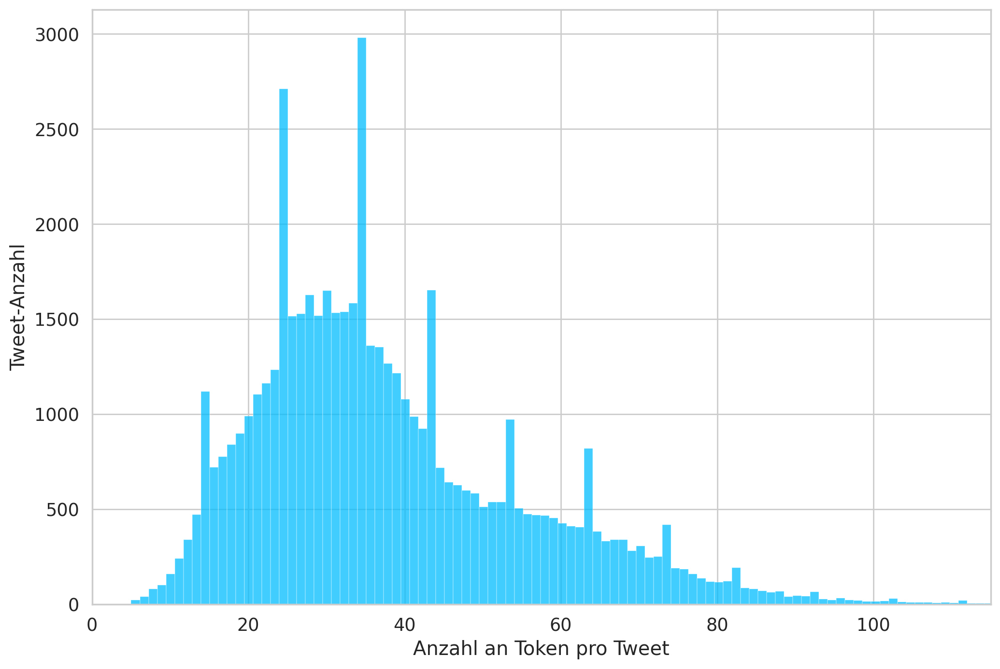

In [ ]:
# Info: Token-Anzahl näher betrachten  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

tokenplot = sns.histplot(token_counts_lv1)
tokenplot.set(xlabel="Anzahl an Token pro Tweet", ylabel="Tweet-Anzahl")
plt.xlim([0, 115])
plt.show()

## Maximale Tokenanzahl festlegen



In [ ]:
MAX_TOKEN_COUNT = 115

## Spaltenbeschriftungen in Variabeln setzen

In [ ]:
# Info: Token-Anzahl näher betrachten und LABEL_COLUMNS festlegen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

LABEL_COLUMNS_LV1 = train_df_lv1_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV1

['earthquake', 'floods', 'hurricane', 'wildfires']

In [ ]:
# Info: Token-Anzahl näher betrachten und LABEL_COLUMNS festlegen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

LABEL_COLUMNS_LV2 = train_df_lv2_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV2

['caution_and_advice',
 'displaced_people_and_evacuations',
 'infrastructure_and_utility_damage',
 'injured_or_dead_people',
 'missing_or_found_people',
 'not_humanitarian',
 'other_relevant_information',
 'requests_or_urgent_needs',
 'rescue_volunteering_or_donation_effort',
 'sympathy_and_support']

In [ ]:
LABEL_COLUMNS_LV2_EQU = train_df_lv2_equ_resampled_ohencoded.columns.tolist()[1:]
LABEL_COLUMNS_LV2_EQU

['caution_and_advice',
 'displaced_people_and_evacuations',
 'infrastructure_and_utility_damage',
 'injured_or_dead_people',
 'not_humanitarian',
 'other_relevant_information',
 'requests_or_urgent_needs',
 'rescue_volunteering_or_donation_effort',
 'sympathy_and_support']

## Datenset-, Datenmodul- und Kennzeichner-Klasse erstellen

In [ ]:
# Info: Tokenisierungsprozess in eine Klasse verpacken (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsDataset(Dataset):

  def __init__(
    self, 
    labelcolumns, #neu hinzugefügt
    data: pd.DataFrame, 
    tokenizer: BertTokenizer, 
    max_token_len: int = MAX_TOKEN_COUNT
  ):
    self.tokenizer = tokenizer
    self.data = data
    self.max_token_len = max_token_len
    self.labelcolumns = labelcolumns #neu hinzugefügt
    
  def __len__(self):
    return len(self.data)

  def __getitem__(self, index: int):
    data_row = self.data.iloc[index]

    tweet_text = data_row.tweet_text
    labels = data_row[self.labelcolumns] #neu hinzugefügt

    encoding = self.tokenizer.encode_plus(
      tweet_text,
      add_special_tokens=True,
      max_length=self.max_token_len,
      return_token_type_ids=False,
      padding="max_length",
      truncation=True,
      return_attention_mask=True,
      return_tensors='pt',
    )

    return dict(
      tweet_text=tweet_text,
      input_ids=encoding["input_ids"].flatten(),
      attention_mask=encoding["attention_mask"].flatten(),
      labels=torch.FloatTensor(labels)
    )

In [ ]:
# Info: Datenmodul-Klasse erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsDataModule(pl.LightningDataModule):

  def __init__(self, train_df, val_df, tokenizer, labelcolumns, n_workers=2, batch_size=8, max_token_len=MAX_TOKEN_COUNT): #change!: val_df, labelcolumns, n_workers; test weg
    super().__init__()
    self.batch_size = batch_size
    self.train_df = train_df
    self.val_df = val_df #neu hinzugefügt
    #self.test_df = test_df
    self.tokenizer = bertbase_tokenizer
    self.labelcolumns = labelcolumns
    self.n_workers = n_workers
    self.max_token_len = max_token_len

  def setup(self, stage=None):
    self.train_dataset = DisasterTweetsDataset(self.labelcolumns, self.train_df, self.tokenizer, self.max_token_len)
    self.val_dataset = DisasterTweetsDataset(self.labelcolumns, self.val_df, self.tokenizer, self.max_token_len) #new!                                       
    #self.test_dataset = DisasterTweetsDataset(self.labelcolumns, self.test_df, self.tokenizer, self.max_token_len)

  def train_dataloader(self):
    return DataLoader(
      self.train_dataset,
      batch_size=self.batch_size,
      shuffle=True,
      num_workers=self.n_workers
    )

  def val_dataloader(self):
    return DataLoader(
      self.val_dataset, #neu hinzugefügt
      batch_size=self.batch_size,
      num_workers=self.n_workers
    )

  def test_dataloader(self):
    return DataLoader(
      self.val_dataset, #statt test_dataset -> val_dataset
      batch_size=self.batch_size,
      num_workers=self.n_workers
    )

In [ ]:
# Info: Kennzeichner-Klasse erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

class DisasterTweetsTagger(pl.LightningModule):

  def __init__(self, n_classes: int, n_training_steps=None, n_warmup_steps=None): #added: train_df
    super().__init__()
    print(f'{time.time()}: initialization of disaster Tweets Tagger')
    self.save_hyperparameters() #neu hinzugefügt; Quelle: https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html
    self.n_classes = n_classes #neu hinzugefügt
    self.bert = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)
    self.classifier = nn.Linear(self.bert.config.hidden_size, n_classes)
    self.n_training_steps = n_training_steps
    self.n_warmup_steps = n_warmup_steps
    self.criterion = nn.BCELoss()
    self.training_step_outputs = [] #neu hinzugefügt

  def forward(self, input_ids, attention_mask, labels=None):
    output = self.bert(input_ids, attention_mask=attention_mask)
    output = self.classifier(output.pooler_output)
    output = torch.sigmoid(output)    
    loss = 0
    if labels is not None:
        loss = self.criterion(output, labels)
    return loss, output

  def training_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels) #make use of forward function
    self.log("train_loss", loss, prog_bar=True, logger=True)
    self.training_step_outputs.append({"predictions": outputs, "labels": labels}) #new!
    return {"loss": loss, "predictions": outputs, "labels": labels}

  def validation_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("val_loss", loss, prog_bar=True, logger=True)
    return loss

  def test_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, labels)
    self.log("test_loss", loss, prog_bar=True, logger=True)
    return loss
  
  def on_train_epoch_end(self):
    print(f'{time.time()}: end of epoch before saving labels and predictions and clearing output cache') #print timestamp
    labels = []
    predictions = []
    for output in self.training_step_outputs:
      for out_labels in output["labels"].detach().cpu():
        labels.append(out_labels) #form: [tensor([0,1,0,0,0,0,0,0,0,0]), tensor([0,1,0,0,0,0,0,1,0,0]), ..., tensor([0,1,0,0,0,0,0,0,0,1])]
      for out_predictions in output["predictions"].detach().cpu():
        predictions.append(out_predictions) #form: [tensor([0.3848,0.0048,0.3848,0.9848,0.0008,0.3848,0.0048,0.3848,0.0048,0.0048]), ...]
    self.training_step_outputs.clear()
    print(f'{time.time()}: end of epoch after saving labels and predictions and clearing output cache') #print timestamp


  def configure_optimizers(self):
    optimizer = AdamW(self.parameters(), lr=2e-5)
    scheduler = get_linear_schedule_with_warmup(
      optimizer,
      num_warmup_steps=self.n_warmup_steps,
      num_training_steps=self.n_training_steps
    )

    return dict(
      optimizer=optimizer,
      lr_scheduler=dict(
        scheduler=scheduler,
        interval='step'
      )
    )

## BERT Modell instanzieren

In [ ]:
# Info: BERT-Modell instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

bert_model = BertModel.from_pretrained(BERT_MODEL_NAME, return_dict=True)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Datenmodule instanzieren

In [ ]:
# Info: Datenmodul-Klasse für Level1/2 instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# Anzahl an Epochen
EP_LV1 = 10
EP_LV2 = 10
EP_LV2_EQU = 10
EP_LV2_HRC = 10
EP_LV2_FLD = 10
EP_LV2_WFR = 10

# Anzahl der Batch-Größen
BS_LV1 = 12
BS_LV2 = 12
BS_LV2_EQU = 3 #3, weil kleiner Datensatz
BS_LV2_HRC = 10
BS_LV2_FLD = 10
BS_LV2_WFR = 10

# Instanzierung der  Datenmodule
#info: Parameter 'test_df' und 'labelColumns' sind neu!
# für over- undersampling methode:
data_module_lv1 = DisasterTweetsDataModule(train_df_lv1_resampled_ohencoded, val_df_lv1_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV1, 12, batch_size=BS_LV1, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2 = DisasterTweetsDataModule(train_df_lv2_resampled_ohencoded, val_df_lv2_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV2, 12, batch_size=BS_LV2, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_equ = DisasterTweetsDataModule(train_df_lv2_equ_resampled_ohencoded, val_df_lv2_equ_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV2_EQU, 4, batch_size=BS_LV2_EQU, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_hrc = DisasterTweetsDataModule(train_df_lv2_hrc_resampled_ohencoded, val_df_lv2_hrc_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_HRC, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_fld = DisasterTweetsDataModule(train_df_lv2_fld_resampled_ohencoded, val_df_lv2_fld_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_FLD, max_token_len=MAX_TOKEN_COUNT)
data_module_lv2_wfr = DisasterTweetsDataModule(train_df_lv2_wfr_resampled_ohencoded, val_df_lv2_wfr_ohencoded, bertbase_tokenizer, LABEL_COLUMNS_LV2, 4, batch_size=BS_LV2_WFR, max_token_len=MAX_TOKEN_COUNT)

## Trainings-Einstellungen definieren und Kennzeichner-Klasse (bzw. Modell) instanzieren

In [ ]:
# Funktion für Eruierung der Anzahl an Trainingsschritten erstellen und anwenden

def calc_total_train_steps(dataset, batch_size, n_epochs):
  steps_per_epoch = len(dataset) // batch_size
  return steps_per_epoch * n_epochs

def calc_warmup_steps(total_training_steps, percentage):
  return int(total_training_steps * percentage)

percentage_warmup_steps = 0.2

total_training_steps_lv1 = calc_total_train_steps(train_df_lv1_resampled_ohencoded, BS_LV1, EP_LV1)
total_training_steps_lv2 = calc_total_train_steps(train_df_lv2_resampled_ohencoded, BS_LV2, EP_LV2)
total_training_steps_lv2_equ = calc_total_train_steps(train_df_lv2_equ_resampled_ohencoded, BS_LV2_EQU, EP_LV2_EQU)
total_training_steps_lv2_fld = calc_total_train_steps(train_df_lv2_fld_resampled_ohencoded, BS_LV2_FLD, EP_LV2_FLD)
total_training_steps_lv2_hrc = calc_total_train_steps(train_df_lv2_hrc_resampled_ohencoded, BS_LV2_HRC, EP_LV2_HRC)
total_training_steps_lv2_wfr = calc_total_train_steps(train_df_lv2_wfr_resampled_ohencoded, BS_LV2_WFR, EP_LV2_WFR)

warmup_steps_lv1 = calc_warmup_steps(total_training_steps_lv1, percentage_warmup_steps)
warmup_steps_lv2 = calc_warmup_steps(total_training_steps_lv2, percentage_warmup_steps)
warmup_steps_lv2_equ = calc_warmup_steps(total_training_steps_lv2_equ, percentage_warmup_steps)
warmup_steps_lv2_fld = calc_warmup_steps(total_training_steps_lv2_fld, percentage_warmup_steps)
warmup_steps_lv2_hrc = calc_warmup_steps(total_training_steps_lv2_hrc, percentage_warmup_steps)
warmup_steps_lv2_wfr = calc_warmup_steps(total_training_steps_lv2_wfr, percentage_warmup_steps)

print('LV1/Modell β Total Training Steps: ' + str(total_training_steps_lv1))
print('LV1/Modell β Warmup Steps: ' + str(warmup_steps_lv1) + '\n')
print('LV2/Modell α Total Training Steps: ' + str(total_training_steps_lv2))
print('LV2/Modell α Warmup Steps: ' + str(warmup_steps_lv2) + '\n')
print('LV2_EQU/Modell γ(e) Total Training Steps: ' + str(total_training_steps_lv2_equ))
print('LV2_EQU/Modell γ(e) Warmup Steps: ' + str(warmup_steps_lv2_equ) + '\n')
print('LV2_FLD/Modell γ(f) Total Training Steps: ' + str(total_training_steps_lv2_fld))
print('LV2_FLD/Modell γ(f) Warmup Steps: ' + str(warmup_steps_lv2_fld) + '\n')
print('LV2_HRC/Modell γ(h) Total Training Steps: ' + str(total_training_steps_lv2_hrc))
print('LV2_HRC/Modell γ(h) Warmup Steps: ' + str(warmup_steps_lv2_hrc) + '\n')
print('LV2_WFR/Modell γ(w) Total Training Steps: ' + str(total_training_steps_lv2_wfr))
print('LV2_WFR/Modell γ(w) Warmup Steps: ' + str(warmup_steps_lv2_wfr))

LV1/Modell β Total Training Steps: 26050
LV1/Modell β Warmup Steps: 5210

LV2/Modell α Total Training Steps: 44600
LV2/Modell α Warmup Steps: 8920

LV2_EQU/Modell γ(e) Total Training Steps: 20820
LV2_EQU/Modell γ(e) Warmup Steps: 4164

LV2_FLD/Modell γ(f) Total Training Steps: 7810
LV2_FLD/Modell γ(f) Warmup Steps: 1562

LV2_HRC/Modell γ(h) Total Training Steps: 31670
LV2_HRC/Modell γ(h) Warmup Steps: 6334

LV2_WFR/Modell γ(w) Total Training Steps: 7790
LV2_WFR/Modell γ(w) Warmup Steps: 1558


In [ ]:
# Info: Trainings-Einstellungen definieren und Kennzeichner-Klasse für Level1/2 instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

model_lv1 = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV1),
  n_training_steps=total_training_steps_lv1,
  n_warmup_steps=warmup_steps_lv1,
)

model_lv2 = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_training_steps=total_training_steps_lv2,
  n_warmup_steps=warmup_steps_lv2
)

model_lv2_equ = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2_EQU),
  n_training_steps=total_training_steps_lv2_equ,
  n_warmup_steps=warmup_steps_lv2_equ,
)

model_lv2_fld = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_training_steps=total_training_steps_lv2_fld,
  n_warmup_steps=warmup_steps_lv2_fld,
)

model_lv2_hrc = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_training_steps=total_training_steps_lv2_hrc,
  n_warmup_steps=warmup_steps_lv2_hrc,
)

model_lv2_wfr = DisasterTweetsTagger(
  n_classes=len(LABEL_COLUMNS_LV2),
  n_training_steps=total_training_steps_lv2_wfr,
  n_warmup_steps=warmup_steps_lv2_wfr,
)


1684677830.54706: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1684677831.9984486: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1684677833.457699: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1684677835.0078638: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1684677836.4950814: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


1684677837.9320185: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
print(calc_total_train_steps(train_df_lv2_wfr_resampled_ohencoded, BS_LV2_WFR, EP_LV2_WFR))

7790


## Tensorboard initiieren, Callbacks und Trainer definieren



In [ ]:
# Info: Entfernen von 'lightning_logs' und 'checkpoints' (gleiche Code-Quelle wie in vorheriger Code-Zelle)

!rm -rf lightning_logs/
!rm -rf checkpoints/

In [ ]:
# Info: Tensorboard initiieren und Log-Lokation definieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

<IPython.core.display.Javascript object>

In [ ]:
# logger:
logger = TensorBoardLogger("lightning_logs", name="disaster-tweets")

In [ ]:
# Info: Callbacks instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# callbacks:
# changes: #new!change! before the dirpath was: "checkpoints"
def create_checkpoint_callback(datasetname):
  return ModelCheckpoint(
  dirpath="/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints", 
  filename = datasetname, 
  save_top_k=1, 
  verbose=True, 
  monitor="val_loss", 
  mode="min"
  )
  
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)

class TimeLoggerCallback(pl.Callback):
    def on_train_start(self, trainer, pl_module):
        self.train_start_time = time.time()
    
    def on_train_epoch_end(self, trainer, pl_module):
        epoch_time = time.time() - self.train_start_time
        trainer.logger.log_metrics({"train_epoch_time": epoch_time}, step=trainer.current_epoch)

time_logger_callback = TimeLoggerCallback()

In [ ]:
# Info: Trainer instanzieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

# Änderungen:
  # does not work anymore -> checkpoint_callback=checkpoint_callback, update of Trainer API here: https://discuss.huggingface.co/t/typeerror-init-got-an-unexpected-keyword-argument-checkpoint-callback/21542
  # does not work anymore -> gpus=1, update: https://lightning.ai/docs/pytorch/stable/common/trainer.html
  # does not work anymore -> progress_bar_refresh_rate=30, just let it out completely

trainer_lv1 = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv1_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV1, num_nodes=1)
trainer_lv2 = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2, num_nodes=1)
trainer_lv2_equ = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_equ_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_EQU, num_nodes=1)
trainer_lv2_hrc = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_hrc_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_HRC, num_nodes=1)
trainer_lv2_fld = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_fld_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_FLD, num_nodes=1)
trainer_lv2_wfr = pl.Trainer(logger=logger, callbacks=[early_stopping_callback, create_checkpoint_callback('train_df_lv2_wfr_resampled_ohencoded'), time_logger_callback], max_epochs=EP_LV2_WFR, num_nodes=1)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utili

# Training, Test und Evaluation

## Modell-Training und -Validierung

In [ ]:
# Info: Modelle trainieren (gleiche Code-Quelle wie in vorheriger Code-Zelle)

print(time.time())
trainer_lv1.fit(model_lv1, datamodule=data_module_lv1)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW

1684273607.361714


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684273797.7087865: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 2605: 'val_loss' reached 0.05608 (best 0.05608), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded-v2.ckpt' as top 1


1684273800.3611376: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684273991.429108: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 5210: 'val_loss' reached 0.04761 (best 0.04761), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded-v2.ckpt' as top 1


1684273994.4965925: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684274188.5556257: end of epoch before saving labels and predictions and clearing output cache
1684274190.8498461: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 7815: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

1684274379.948408: end of epoch before saving labels and predictions and clearing output cache
1684274382.6751895: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 10420: 'val_loss' was not in top 1


In [ ]:
# Info: Double Check ob Validation Loss ähnlich ist
# Code-Quelle: Pytorch Lightning Docs
# Link: https://lightning.ai/docs/pytorch/stable/common/trainer.html

# vorher ohne Parameter ausführen, dann Fehlermeldung, dann mit Parameter ausführen
trainer_lv1.validate(model_lv1, datamodule=data_module_lv1)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.04821868613362312    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.04821868613362312}]

In [ ]:
print(time.time())
trainer_lv2.fit(model_lv2, datamodule=data_module_lv2)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW

1684271727.0940719


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684272036.9149218: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 4461: 'val_loss' reached 0.13459 (best 0.13459), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded-v5.ckpt' as top 1


1684272041.5233402: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684272355.8976657: end of epoch before saving labels and predictions and clearing output cache
1684272360.2172668: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 8922: 'val_loss' reached 0.12001 (best 0.12001), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded-v5.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

1684272676.4145164: end of epoch before saving labels and predictions and clearing output cache
1684272680.4006608: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 13383: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

1684272994.3837807: end of epoch before saving labels and predictions and clearing output cache
1684272998.3576093: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 17844: 'val_loss' was not in top 1


In [ ]:
trainer_lv2.validate(model_lv2, datamodule=data_module_lv2)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.12747618556022644    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.12747618556022644}]

In [ ]:
print(time.time())
trainer_lv2_equ.fit(model_lv2_equ, datamodule=data_module_lv2_equ)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type      | Params
-----------------------------------------
0 | bert       | BertModel | 108 M 
1 | classifier | Linear    | 6.9 K 
2 | criterion  | BCELoss   | 0     
-----------------------------------------
108 M     Trainable params
0         Non-trainable params
108 M     Total params
433.269   Total estimated model params size (MB)


1684390858.1503131


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684390967.5985258: end of epoch before saving labels and predictions and clearing output cache
1684390969.214553: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 2082: 'val_loss' reached 0.18378 (best 0.18378), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v3.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

1684391086.300229: end of epoch before saving labels and predictions and clearing output cache
1684391087.957279: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 4164: 'val_loss' reached 0.11906 (best 0.11906), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded-v3.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

1684391207.0425472: end of epoch before saving labels and predictions and clearing output cache
1684391208.7072496: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 6246: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

1684391318.615785: end of epoch before saving labels and predictions and clearing output cache
1684391320.3291318: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 8328: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_equ.validate(model_lv2_equ, datamodule=data_module_lv2_equ)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.15567544102668762    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.15567544102668762}]

In [ ]:
print(time.time())
trainer_lv2_fld.fit(model_lv2_fld, datamodule=data_module_lv2_fld)

1684393750.7628887


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type      | Params
-----------------------------------------
0 | bert       | BertModel | 108 M 
1 | classifier | Linear    | 7.7 K 
2 | criterion  | BCELoss   | 0     
-----------------------------------------
108 M     Trainable params
0         Non-

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684393818.7424862: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 781: 'val_loss' reached 0.28040 (best 0.28040), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v2.ckpt' as top 1


1684393819.3960228: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684393890.3823159: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 1562: 'val_loss' reached 0.16909 (best 0.16909), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v2.ckpt' as top 1


1684393891.0898886: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684393961.2760692: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 2343: 'val_loss' reached 0.15118 (best 0.15118), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded-v2.ckpt' as top 1


1684393962.0784147: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684394033.2835371: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 3124: 'val_loss' was not in top 1


1684394034.047674: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684394096.8517523: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 3905: 'val_loss' was not in top 1


1684394097.5420141: end of epoch after saving labels and predictions and clearing output cache


In [ ]:
print(time.time())
trainer_lv2_hrc.fit(model_lv2_hrc, datamodule=data_module_lv2_hrc)

1684392177.3606942


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type      | Params
-----------------------------------------
0 | bert       | BertModel | 108 M 
1 | classifier | Linear    | 7.7 K 
2 | criterion  | BCELoss   | 0     
-----------------------------------------
108 M     Trainable params
0         Non-

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684392428.634526: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 3167: 'val_loss' reached 0.14878 (best 0.14878), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded-v3.ckpt' as top 1


1684392431.7120302: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684392690.9223502: end of epoch before saving labels and predictions and clearing output cache
1684392693.648383: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 6334: 'val_loss' reached 0.13426 (best 0.13426), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded-v3.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

1684392953.2259116: end of epoch before saving labels and predictions and clearing output cache
1684392956.0629127: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 9501: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

1684393206.6625187: end of epoch before saving labels and predictions and clearing output cache
1684393209.6033163: end of epoch after saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 12668: 'val_loss' was not in top 1


In [ ]:
trainer_lv2_hrc.validate(model_lv2_hrc, datamodule=data_module_lv2_hrc)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.13587889075279236    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.13587889075279236}]

In [ ]:
trainer_lv2_fld.validate(model_lv2_fld, datamodule=data_module_lv2_fld)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.15118466317653656    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.15118466317653656}]

In [ ]:
print(time.time())
trainer_lv2_wfr.fit(model_lv2_wfr, datamodule=data_module_lv2_wfr)

1684394768.1453795


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/TransformingDisasterTweets/Checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type      | Params
-----------------------------------------
0 | bert       | BertModel | 108 M 
1 | classifier | Linear    | 7.7 K 
2 | criterion  | BCELoss   | 0     
-----------------------------------------
108 M     Trainable params
0         Non-

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

1684394835.5860069: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 779: 'val_loss' reached 0.24008 (best 0.24008), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded-v2.ckpt' as top 1


1684394836.275926: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684394906.2110167: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 1558: 'val_loss' reached 0.14252 (best 0.14252), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded-v2.ckpt' as top 1


1684394906.893679: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684394977.344496: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 2337: 'val_loss' reached 0.12838 (best 0.12838), saving model to '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded-v2.ckpt' as top 1


1684394978.1624148: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684395048.2530048: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 3116: 'val_loss' was not in top 1


1684395048.943178: end of epoch after saving labels and predictions and clearing output cache


Validation: 0it [00:00, ?it/s]

1684395111.5095236: end of epoch before saving labels and predictions and clearing output cache


INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 3895: 'val_loss' was not in top 1


1684395112.3482916: end of epoch after saving labels and predictions and clearing output cache


In [ ]:
trainer_lv2_wfr.validate(model_lv2_wfr, datamodule=data_module_lv2_wfr)

INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │    0.12800385057926178    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.12800385057926178}]

## Testen mit Trainingsmodellen

### Funktionen

In [ ]:
# Info: Funktionen erstellen für automatisierteren Prozess (selbst-definierte Funktionen)

# Funktion für das Testen und Kreieren von Datenrahmen und Tensoren
def test_and_create_eventtype_dataframes_and_tensors(event_type,
        df_to_copy, 
        predictions_column_name, 
        filtered_type,
        drop_column,
        ohe_column,
        ohencoder,
        oh_columns,
        model_loading_module,
        model_path,
        label_columns,
        tokenizer,
        max_token_count,
        category_dict):
  # Eine Kopie machen
  initial_df = df_to_copy.copy()
  # Relevante Daten herausfiltern
  initial_df = initial_df[initial_df[predictions_column_name] == filtered_type].reset_index(drop=True)
  # Datenrahmen abspeichern
  initial_df.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_filtered_reindexed.csv', index=False) #warum index=False? Damit beim reloaden keine zusäztliche Column 'Unnamed: 0' kommt (quelle ChatGPT)
  print('initial df created and saved.')
  # One-Hot-Kodierung
  initial_df_ohencoded = initial_df.copy().drop([predictions_column_name, drop_column], axis=1)
  initial_df_ohencoded = onehotencode(ohencoder, oh_columns, initial_df_ohencoded, ohe_column)
  # Datenrahmen inklusive One-Hot-Kodierung abspeichern
  initial_df_ohencoded.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_ohencoded.csv', index=False)
  print('initial df onehotencoded created and saved.')
  # Trainiertes Modell laden
  print('loading a trained model started.')
  trained_model = model_loading_module.load_from_checkpoint(model_path, n_classes=len(label_columns))
  trained_model.eval()
  trained_model.freeze()
  print('trained model successfully loaded.')
  # Trainiertes Modell anwenden
  print('before applying training model...')
  predictions_and_labels = get_predictions_and_labels(trained_model, label_columns, initial_df_ohencoded, tokenizer, max_token_count)
  print('training model successfully applied.')
  predictions_extracted = predictions_and_labels[0]
  labels_extracted = predictions_and_labels[1]
  # Tensoren abspeichern
  torch.save(predictions_extracted, f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_predictions.pt')
  torch.save(labels_extracted, f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_labels.pt')
  print('predictions and labels successfully created and saved.')
  # Argmax für Vorhersagen
  predictions_numerical = torch.argmax(predictions_extracted, dim=1)
  print('argmax successfully.')
  # Tensoren umformen und Datenrahmen mit Tweet-Text, Vorhersagen und korrekten Bezeichnungen erstellen
  predictions_textual = [category_dict[i] for i in predictions_numerical.tolist()]
  predicted_df = pd.DataFrame(initial_df['tweet_text'])
  predicted_df['predictions_class'] = predictions_textual
  predicted_df = predicted_df.merge(initial_df[['class_label']], left_index=True, right_index=True, how='left')
  # neuen Datenrahmen abspeichern
  predicted_df.to_csv(f'/content/drive/MyDrive/TransformingDisasterTweets/Data/{event_type}_afterLV1_predicted.csv', index=False)
  print('Tensors successfully reshaped and df saved.')


# Funktion, um Vorhersagen und Beschriftungen zu bekommen
def get_predictions_and_labels(trained_model, label_columns, df_ohencoded, tokenizer, max_token_count):
  trained_model = trained_model.to(device)
  test_dataset = DisasterTweetsDataset(
      label_columns,
      df_ohencoded,
      tokenizer,
      max_token_len=max_token_count
      )
  predictions = []
  labels = []
  for item in tqdm(test_dataset):
    _, prediction = trained_model(
        item["input_ids"].unsqueeze(dim=0).to(device), 
        item["attention_mask"].unsqueeze(dim=0).to(device)
        )
    predictions.append(prediction.flatten())
    labels.append(item["labels"].int())
    
  predictions = torch.stack(predictions).detach().cpu()
  labels = torch.stack(labels).detach().cpu()
  predictions_and_labels = [predictions, labels]
  # Modell löschen, um RAM-Speicherplatz freizumachen
  del trained_model
  torch.cuda.empty_cache()

  return predictions_and_labels

# Funktion für Informationen
def print_disaster_value_counts(dataframe):
  dataframe_valuecount_general = dataframe['predictions_event_type'].value_counts()
  dataframe_valuecount_eventtype = dataframe['event_type_label'].value_counts()
  dataframe_valuecount_class = dataframe['class_label'].value_counts()
  print('General value counts:')
  print(dataframe_valuecount_general)
  print('\n')
  print('Event type counts:')
  print(dataframe_valuecount_eventtype)
  print('\n')
  print('Humanitarian category counts:')
  print(dataframe_valuecount_class)

In [ ]:
# Info: 'device' definieren
# Code-Quelle: Curiousily, "Multi-label Text Classification with BERT and PyTorch Lightning", 2021
# Link: https://colab.research.google.com/drive/14Ea4lIzsn5EFvPpYKtWStXEByT9qmbkj?usp=sharing or https://curiousily.com/posts/multi-label-text-classification-with-bert-and-pytorch-lightning/

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Dictionaries für Prozesse erstellen

In [ ]:
# Info: Wörterbücher für Prozesse laden (gleiche Code-Quelle wie in vorheriger Code-Zelle)

humanitarian_category_lv2_dict = {0: 'caution_and_advice', 
                                  1: 'displaced_people_and_evacuations', 
                                  2: 'infrastructure_and_utility_damage', 
                                  3: 'injured_or_dead_people', 
                                  4: 'missing_or_found_people',
                                  5: 'not_humanitarian', 
                                  6: 'other_relevant_information', 
                                  7: 'requests_or_urgent_needs', 
                                  8: 'rescue_volunteering_or_donation_effort', 
                                  9: 'sympathy_and_support'}

humanitarian_category_lv2_equ_dict = {0: 'caution_and_advice', 
                                  1: 'displaced_people_and_evacuations', 
                                  2: 'infrastructure_and_utility_damage', 
                                  3: 'injured_or_dead_people', 
                                  4: 'not_humanitarian', 
                                  5: 'other_relevant_information', 
                                  6: 'requests_or_urgent_needs', 
                                  7: 'rescue_volunteering_or_donation_effort', 
                                  8: 'sympathy_and_support'}

### Modell α (LEVEL2)

In [ ]:
# Info: Prozess für Level2-Datensatz durchführen (Modell α mit gesamten Datensatz)
# Quelle: PyTorch Lightning Dokumentation
# Link: https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html

trained_model_lv2 = DisasterTweetsTagger.load_from_checkpoint("/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_resampled_ohencoded.ckpt", n_classes=len(LABEL_COLUMNS_LV2))
trained_model_lv2.eval()
trained_model_lv2.freeze()

trained_model_lv2 = trained_model_lv2.to(device)

test_dataset_lv2 = DisasterTweetsDataset(
  LABEL_COLUMNS_LV2,
  test_df_lv2_ohencoded,
  bertbase_tokenizer,
  max_token_len=MAX_TOKEN_COUNT
)

predictions_lv2 = []
labels_lv2 = []

for item in tqdm(test_dataset_lv2):
  _, prediction = trained_model_lv2(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device)
  )
  predictions_lv2.append(prediction.flatten())
  labels_lv2.append(item["labels"].int())

predictions_lv2 = torch.stack(predictions_lv2).detach().cpu()
labels_lv2 = torch.stack(labels_lv2).detach().cpu()

1684678301.9413967: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/15160 [00:00<?, ?it/s]

In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_filtered_reindexed.csv'))

General value counts:
wildfires    2459
Name: predictions_event_type, dtype: int64


Event type counts:
wildfires     2167
hurricane      254
floods          24
earthquake      14
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    596
injured_or_dead_people                    497
not_humanitarian                          360
other_relevant_information                340
sympathy_and_support                      211
displaced_people_and_evacuations          164
infrastructure_and_utility_damage         154
caution_and_advice                         58
missing_or_found_people                    40
requests_or_urgent_needs                   39
Name: class_label, dtype: int64


In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link 1: https://discuss.pytorch.org/t/delete-model-from-gpu-cpu/123287
# Link 2: https://forums.fast.ai/t/clearing-gpu-memory-pytorch/14637/2

del trained_model_lv2
torch.cuda.empty_cache()

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

torch.save(predictions_lv2, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predictions.pt')
torch.save(labels_lv2, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_labels.pt')

In [ ]:
# Info: Datenrahmen erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

labels_lv2_numerical = torch.argmax(labels_lv2, dim=1)
predictions_lv2_numerical = torch.argmax(predictions_lv2, dim=1)

predictions_lv2_textual = [humanitarian_category_lv2_dict[i] for i in predictions_lv2_numerical.tolist()]
predicted_df_lv2 = pd.DataFrame(test_df_lv2[['tweet_text']])
predicted_df_lv2['predictions_class'] = predictions_lv2_textual

predicted_df_lv2 = predicted_df_lv2.merge(test_df_lv2[['class_label']], left_index=True, right_index=True, how='left')
predicted_df_lv2.to_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predicted_df.csv', index=False)

In [ ]:
predicted_df_lv2

,tweet_text,predictions_class,class_label
0,I can’t imagine hitting send on a tweet like t...,injured_or_dead_people,injured_or_dead_people
1,"#CampFire has killed 77 people, torched an are...",injured_or_dead_people,injured_or_dead_people
2,ὒ5 California Wildfire Update: As of Wednesday...,injured_or_dead_people,injured_or_dead_people
3,"Kanye West reportedly raises $500,000 for Cali...",rescue_volunteering_or_donation_effort,rescue_volunteering_or_donation_effort
4,This morning @KTLA is having a telethon to rai...,rescue_volunteering_or_donation_effort,rescue_volunteering_or_donation_effort
...,...,...,...
15155,RT @jscarto: Severe flooding in #SriLanka seen...,caution_and_advice,caution_and_advice
15156,"Sri Lankans, young and old without and race di...",rescue_volunteering_or_donation_effort,sympathy_and_support
15157,#PhotoOfTheDay: Capt. McPherson of #USSLakeEri...,rescue_volunteering_or_donation_effort,other_relevant_information
15158,RT @sulorammohan: Medical aid for #Flood vict...,rescue_volunteering_or_donation_effort,requests_or_urgent_needs


### Modell β (LEVEL1)

In [ ]:
# Info: Prozess für Level1-Datensatz durchführen (Modell β mit gesamten Datensatz)
# Quelle: PyTorch Lightning Dokumentation
# Link: https://lightning.ai/docs/pytorch/latest/common/checkpointing_basic.html

trained_model_lv1 = DisasterTweetsTagger.load_from_checkpoint("/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv1_resampled_ohencoded.ckpt", n_classes=len(LABEL_COLUMNS_LV1))
trained_model_lv1.eval()
trained_model_lv1.freeze()
trained_model_lv1 = trained_model_lv1.to(device)

test_dataset_lv1 = DisasterTweetsDataset(
  LABEL_COLUMNS_LV1,
  test_df_lv1_ohencoded,
  bertbase_tokenizer,
  max_token_len=MAX_TOKEN_COUNT
)

predictions_lv1 = []
labels_lv1 = []

for item in tqdm(test_dataset_lv1):
  _, prediction = trained_model_lv1(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device)
  )
  predictions_lv1.append(prediction.flatten())
  labels_lv1.append(item["labels"].int())

predictions_lv1 = torch.stack(predictions_lv1).detach().cpu()
labels_lv1 = torch.stack(labels_lv1).detach().cpu()

1684682297.6111035: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/15160 [00:00<?, ?it/s]

In [ ]:
predictions_lv1

tensor([[3.0102e-03, 1.5738e-02, 4.1134e-02, 9.4331e-01],
        [8.6541e-04, 2.7282e-03, 2.2562e-03, 9.9699e-01],
        [1.0619e-03, 2.1145e-03, 2.6710e-03, 9.9734e-01],
        ...,
        [1.1119e-03, 9.9690e-01, 2.6722e-03, 1.1933e-03],
        [1.6015e-03, 9.9713e-01, 1.9711e-03, 1.2157e-03],
        [1.2496e-03, 9.9707e-01, 2.2467e-03, 1.3697e-03]])

In [ ]:
labels_lv1

tensor([[0, 0, 0, 1],
        [0, 0, 0, 1],
        [0, 0, 0, 1],
        ...,
        [0, 1, 0, 0],
        [0, 1, 0, 0],
        [0, 1, 0, 0]], dtype=torch.int32)

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link 1: https://discuss.pytorch.org/t/delete-model-from-gpu-cpu/123287
# Link 2: https://forums.fast.ai/t/clearing-gpu-memory-pytorch/14637/2
del trained_model_lv1
torch.cuda.empty_cache()

In [ ]:
# Info: Nach dem Testen des Modelles das Modell wieder löschen, um RAM-Speicherplatz frei zu machen  (gleiche Code-Quelle wie in vorheriger Code-Zelle)

torch.save(predictions_lv1, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predictions.pt')
torch.save(labels_lv1, '/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_labels.pt')

In [ ]:
# Info: Datenrahmen erstellen (gleiche Code-Quelle wie in vorheriger Code-Zelle)

labels_lv1_numerical = torch.argmax(labels_lv1, dim=1)
predictions_lv1_numerical = torch.argmax(predictions_lv1, dim=1)

category_dict = {0: 'earthquake', 1: 'floods', 2: 'hurricane', 3: 'wildfires'}
predictions_lv1_textual = [category_dict[i] for i in predictions_lv1_numerical.tolist()]
predicted_df_lv1 = pd.DataFrame(test_df_lv1['tweet_text'])
predicted_df_lv1['predictions_event_type'] = predictions_lv1_textual

predicted_df_lv1 = predicted_df_lv1.merge(test_df[['event_type_label','class_label']], left_index=True, right_index=True, how='left')
predicted_df_lv1.to_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predicted_df.csv', index=False)

In [ ]:
labels_lv1_numerical

tensor([3, 3, 3,  ..., 1, 1, 1])

In [ ]:
predictions_lv1_numerical

tensor([3, 3, 3,  ..., 1, 1, 1])

In [ ]:
predicted_df_lv1

,tweet_text,predictions_event_type,event_type_label,class_label
0,I can’t imagine hitting send on a tweet like t...,wildfires,wildfires,injured_or_dead_people
1,"#CampFire has killed 77 people, torched an are...",wildfires,wildfires,injured_or_dead_people
2,ὒ5 California Wildfire Update: As of Wednesday...,wildfires,wildfires,injured_or_dead_people
3,"Kanye West reportedly raises $500,000 for Cali...",wildfires,wildfires,rescue_volunteering_or_donation_effort
4,This morning @KTLA is having a telethon to rai...,wildfires,wildfires,rescue_volunteering_or_donation_effort
...,...,...,...,...
15155,RT @jscarto: Severe flooding in #SriLanka seen...,floods,floods,caution_and_advice
15156,"Sri Lankans, young and old without and race di...",floods,floods,sympathy_and_support
15157,#PhotoOfTheDay: Capt. McPherson of #USSLakeEri...,floods,floods,other_relevant_information
15158,RT @sulorammohan: Medical aid for #Flood vict...,floods,floods,requests_or_urgent_needs


In [ ]:
predicted_df_lv1 = pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predicted_df.csv')

### Modell γ(e) (EQU)

In [ ]:
# Info: Prozess für Earthquake-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('equ',
        predicted_df_lv1, 
        'predictions_event_type', 
        'earthquake',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2_EQU,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_equ_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2_EQU,
        bertbase_tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_equ_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.
1684423605.0238702: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/1851 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_filtered_reindexed.csv'))

General value counts:
earthquake    1851
Name: predictions_event_type, dtype: int64


Event type counts:
earthquake    1730
hurricane      117
floods           3
wildfires        1
Name: event_type_label, dtype: int64


Humanitarian category counts:
sympathy_and_support                      504
rescue_volunteering_or_donation_effort    416
injured_or_dead_people                    308
other_relevant_information                171
infrastructure_and_utility_damage         152
caution_and_advice                        129
not_humanitarian                          111
requests_or_urgent_needs                   43
displaced_people_and_evacuations           17
Name: class_label, dtype: int64


### Modell γ(f) (FLD)

In [ ]:
# Info: Prozess für Floods-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('fld',
        predicted_df_lv1, 
        'predictions_event_type', 
        'floods',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_fld_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        bertbase_tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.
1684423761.7141585: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/2172 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_filtered_reindexed.csv'))

General value counts:
floods    2172
Name: predictions_event_type, dtype: int64


Event type counts:
floods       2141
hurricane      28
wildfires       3
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    1077
other_relevant_information                 277
sympathy_and_support                       220
not_humanitarian                           168
requests_or_urgent_needs                   135
infrastructure_and_utility_damage          101
injured_or_dead_people                      95
caution_and_advice                          60
missing_or_found_people                     28
displaced_people_and_evacuations            11
Name: class_label, dtype: int64


### Modell γ(h) (HRC)

In [ ]:
# Info: Prozess für Hurricane-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('hrc',
        predicted_df_lv1, 
        'predictions_event_type', 
        'hurricane',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_hrc_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        bertbase_tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.
1684423837.0386932: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/8678 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


In [ ]:
print_disaster_value_counts(pd.read_csv('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_filtered_reindexed.csv'))

General value counts:
hurricane    8678
Name: predictions_event_type, dtype: int64


Event type counts:
hurricane     8567
floods          46
wildfires       36
earthquake      29
Name: event_type_label, dtype: int64


Humanitarian category counts:
rescue_volunteering_or_donation_effort    2130
other_relevant_information                1619
infrastructure_and_utility_damage         1210
sympathy_and_support                       837
caution_and_advice                         823
not_humanitarian                           606
displaced_people_and_evacuations           598
injured_or_dead_people                     547
requests_or_urgent_needs                   304
missing_or_found_people                      4
Name: class_label, dtype: int64


### Modell γ(w) (WFR)

In [ ]:
# Info: Prozess für Wildfires-Datensatz durchführen

test_and_create_eventtype_dataframes_and_tensors('wfr',
        predicted_df_lv1, 
        'predictions_event_type', 
        'wildfires',
        'event_type_label',
        'class_label',
        encoder,
        COLUMNS_LV2,
        DisasterTweetsTagger,
        '/content/drive/MyDrive/TransformingDisasterTweets/Checkpoints/train_df_lv2_wfr_resampled_ohencoded.ckpt',
        LABEL_COLUMNS_LV2,
        bertbase_tokenizer,
        MAX_TOKEN_COUNT,
        humanitarian_category_lv2_dict)

initial df created and saved.
initial df onehotencoded created and saved.
loading a trained model started.
1684423982.747836: initialization of disaster Tweets Tagger


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


trained model successfully loaded.
before applying training model...


  0%|          | 0/2459 [00:00<?, ?it/s]

training model successfully applied.
predictions and labels successfully created and saved.
argmax successfully.
Tensors successfully reshaped and df saved.


## Laden und Zusammenführen der Datenrahmen

In [ ]:
# Info: Predictions und Labels jeder einzelnen Vorhersage laden, anpassen und zusammenführen
# Code-Quelle: Pytorch, "pytorch doku", 2023
# Link: https://pytorch.org/

# load
equ_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_labels.pt')
equ_afterLV1_labels_adjusted = torch.cat([equ_afterLV1_labels[:, :4], torch.zeros((equ_afterLV1_labels.shape[0], 1)), equ_afterLV1_labels[:, 4:]], dim=1)
equ_afterLV1_labels_numerical = torch.argmax(equ_afterLV1_labels, dim=1)

equ_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/equ_afterLV1_predictions.pt')
equ_afterLV1_predictions_adjusted = torch.cat([equ_afterLV1_predictions[:, :4], torch.zeros((equ_afterLV1_predictions.shape[0], 1)), equ_afterLV1_predictions[:, 4:]], dim=1)
equ_afterLV1_predictions_numerical = torch.argmax(equ_afterLV1_predictions, dim=1)

fld_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_labels.pt')
fld_afterLV1_labels_numerical = torch.argmax(fld_afterLV1_labels, dim=1)
fld_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/fld_afterLV1_predictions.pt')
fld_afterLV1_predictions_numerical = torch.argmax(fld_afterLV1_predictions, dim=1)

hrc_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_labels.pt')
hrc_afterLV1_labels_numerical = torch.argmax(hrc_afterLV1_labels, dim=1)
hrc_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/hrc_afterLV1_predictions.pt')
hrc_afterLV1_predictions_numerical = torch.argmax(hrc_afterLV1_predictions, dim=1)

wfr_afterLV1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_labels.pt')
wfr_afterLV1_labels_numerical = torch.argmax(wfr_afterLV1_labels, dim=1)
wfr_afterLV1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/wfr_afterLV1_predictions.pt')
wfr_afterLV1_predictions_numerical = torch.argmax(wfr_afterLV1_predictions, dim=1)

#merge
merged_afterLV1_labels = torch.cat((equ_afterLV1_labels_adjusted, fld_afterLV1_labels, hrc_afterLV1_labels, wfr_afterLV1_labels), dim=0)
print(len(merged_afterLV1_labels))

merged_afterLV1_labels_numerical = torch.cat((equ_afterLV1_labels_numerical, fld_afterLV1_labels_numerical, hrc_afterLV1_labels_numerical, wfr_afterLV1_labels_numerical), dim=0)
print(len(merged_afterLV1_labels_numerical))

merged_afterLV1_predictions = torch.cat((equ_afterLV1_predictions_adjusted, fld_afterLV1_predictions, hrc_afterLV1_predictions, wfr_afterLV1_predictions), dim=0)
print(len(merged_afterLV1_predictions))

merged_afterLV1_predictions_numerical = torch.cat((equ_afterLV1_predictions_numerical, fld_afterLV1_predictions_numerical, hrc_afterLV1_predictions_numerical, wfr_afterLV1_predictions_numerical), dim=0)
print(len(merged_afterLV1_predictions_numerical))

15160
15160
15160
15160


In [ ]:
equ_afterLV1_labels_numerical

tensor([7, 7, 3,  ..., 2, 7, 7])

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import torch

In [ ]:
lv1_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_predictions.pt')
lv1_predictions_numerical = torch.argmax(lv1_predictions, dim=1)
lv1_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv1_labels.pt')
lv1_labels_numerical = torch.argmax(lv1_labels, dim=1)

##Konfusionsmatrizes

In [ ]:
def show_disaster_tweet_prediction_distribution_general(labels_numerical,
                                                        predictions_numerical,
                                                        figsize_input,
                                                        heatmap_fontsize,
                                                        rotation_x,
                                                        rotation_y,
                                                        xylabels_fontsize,
                                                        horizontalalignment_input,
                                                        labels_array,
                                                        xlabel_fontsize,
                                                        ylabel_fontsize):
  cm = confusion_matrix(labels_numerical, predictions_numerical)
  fig, ax = plt.subplots(figsize=figsize_input)
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', ax=ax, annot_kws={"fontsize": heatmap_fontsize})
  ax.set_xticklabels(labels_array, rotation=rotation_x, ha='right', fontsize=xylabels_fontsize, horizontalalignment=horizontalalignment_input)
  ax.set_yticklabels(labels_array, rotation=rotation_y, fontsize=xylabels_fontsize, verticalalignment='center')
  plt.xlabel('Vorhergesagt', fontsize=xlabel_fontsize)
  plt.ylabel('Wahr', fontsize=ylabel_fontsize)
  plt.show()

In [ ]:
def show_disaster_tweet_prediction_distribution_detail(labels_numerical, 
                                                       predictions_numerical,
                                                       figsize_input, 
                                                       labels_reshape_input, 
                                                       heatmap_fontsize,
                                                       rotation_x,
                                                       rotation_y, 
                                                       xylabels_fontsize,
                                                       horizontalalignment_input,
                                                       labels_array,
                                                       xlabel_fontsize,
                                                       ylabel_fontsize):
  cm = confusion_matrix(labels_numerical, predictions_numerical)
  normalized_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  fig, ax = plt.subplots(figsize=figsize_input)
  group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     normalized_cm.flatten()]
  labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts, group_percentages)]
  labels = np.asarray(labels).reshape(labels_reshape_input)
  sns.heatmap(normalized_cm, annot=labels, cmap='Blues', fmt='', ax=ax, annot_kws={"fontsize": heatmap_fontsize});  #annot=True to annotate cells, ftm='g' to disable scientific notation
  ax.set_xticklabels(labels_array, rotation=rotation_x, ha='right', fontsize=xylabels_fontsize, horizontalalignment=horizontalalignment_input)
  ax.set_yticklabels(labels_array, rotation=rotation_y, fontsize=xylabels_fontsize, verticalalignment='center')
  plt.xlabel('Vorhergesagt', fontsize=xlabel_fontsize)
  plt.ylabel('Wahr', fontsize=ylabel_fontsize)
  plt.show()

In [ ]:
lv1_cm_class_names = ['earthquake',  'floods',  'hurricane', 'wildfires']

lv2_after_lv1_cm_class_names = ['caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people', 
          'missing_or_found_people', 
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

equ_cm_class_names = ['caution_and_advice', 
          'displaced_people_and_evacuations', 
          'infrastructure_and_utility_damage', 
          'injured_or_dead_people',  
          'not_humanitarian', 
          'other_relevant_information', 
          'requests_or_urgent_needs', 
          'rescue_volunteering_or_donation_effort', 
          'sympathy_and_support']

figsize_input_small = (7, 5)
figsize_input_big = (7, 7)
figsize_input_verybig = (9, 9)

labels_reshape_input_lv1 = (4,4)
labels_reshape_input_lv2 = (10,10)
labels_reshape_input_equ = (9,9)
heatmap_fontsize_small = 9
heatmap_fontsize_medium = 10
heatmap_fontsize_large = 11
rotation_x_none = 0
rotation_x_some = 50
rotation_y_none = 0
rotation_y_some = 90
xylabels_fontsize_big = 11
xylabels_fontsize_small = 9
mainlabels_fontsize = 14

### Architekturart (a) bzw. Modell α (LV2)

In [ ]:
lv2_predictions = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_predictions.pt')
lv2_predictions_numerical = torch.argmax(lv2_predictions, dim=1)

lv2_labels = torch.load('/content/drive/MyDrive/TransformingDisasterTweets/Data/lv2_labels.pt')
lv2_labels_numerical = torch.argmax(lv2_labels, dim=1)

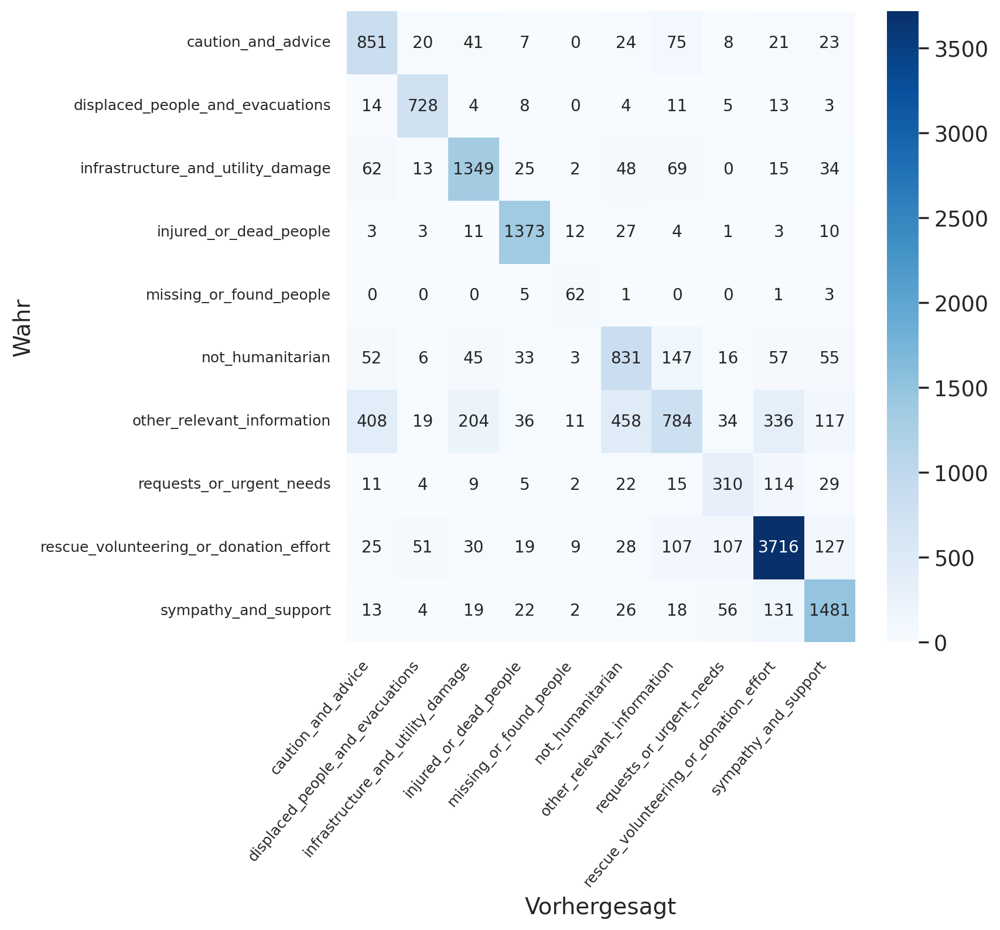

In [ ]:
show_disaster_tweet_prediction_distribution_general(lv2_labels_numerical, lv2_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

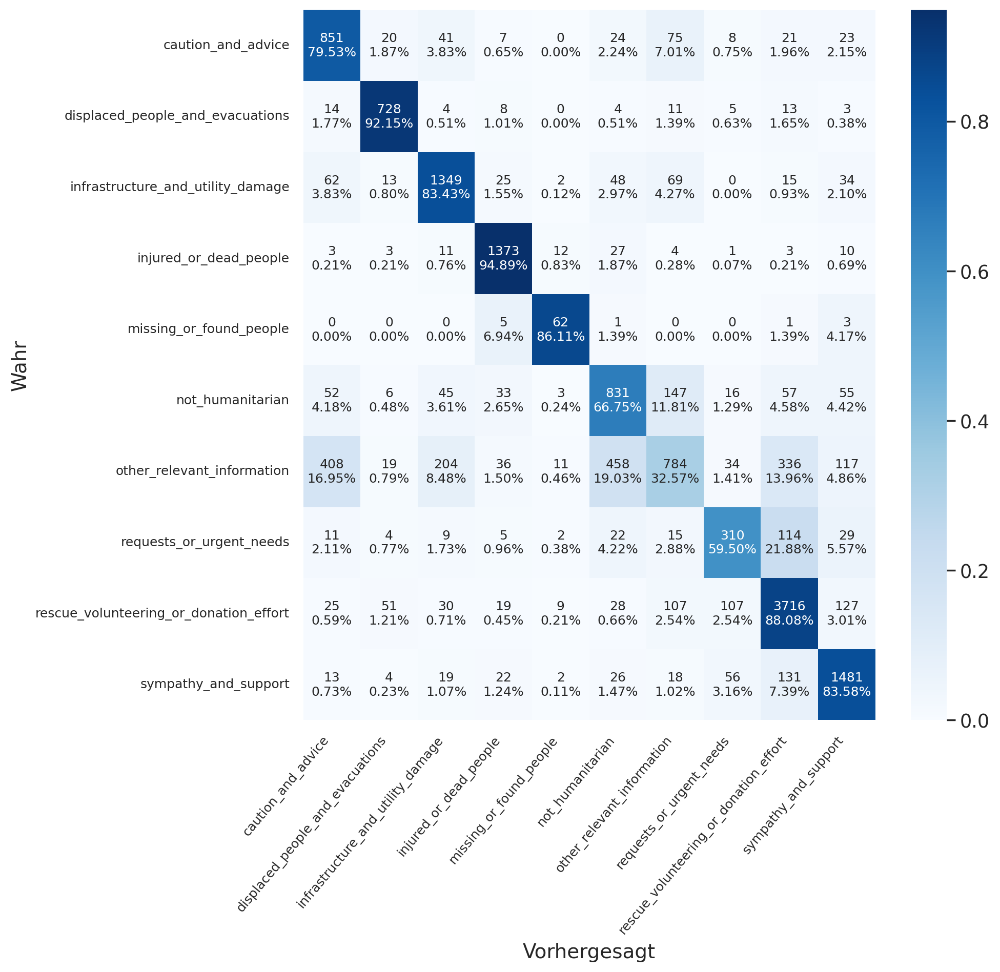

In [ ]:
show_disaster_tweet_prediction_distribution_detail(lv2_labels_numerical, lv2_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Architekturart (b) (LV2 nach LV1)

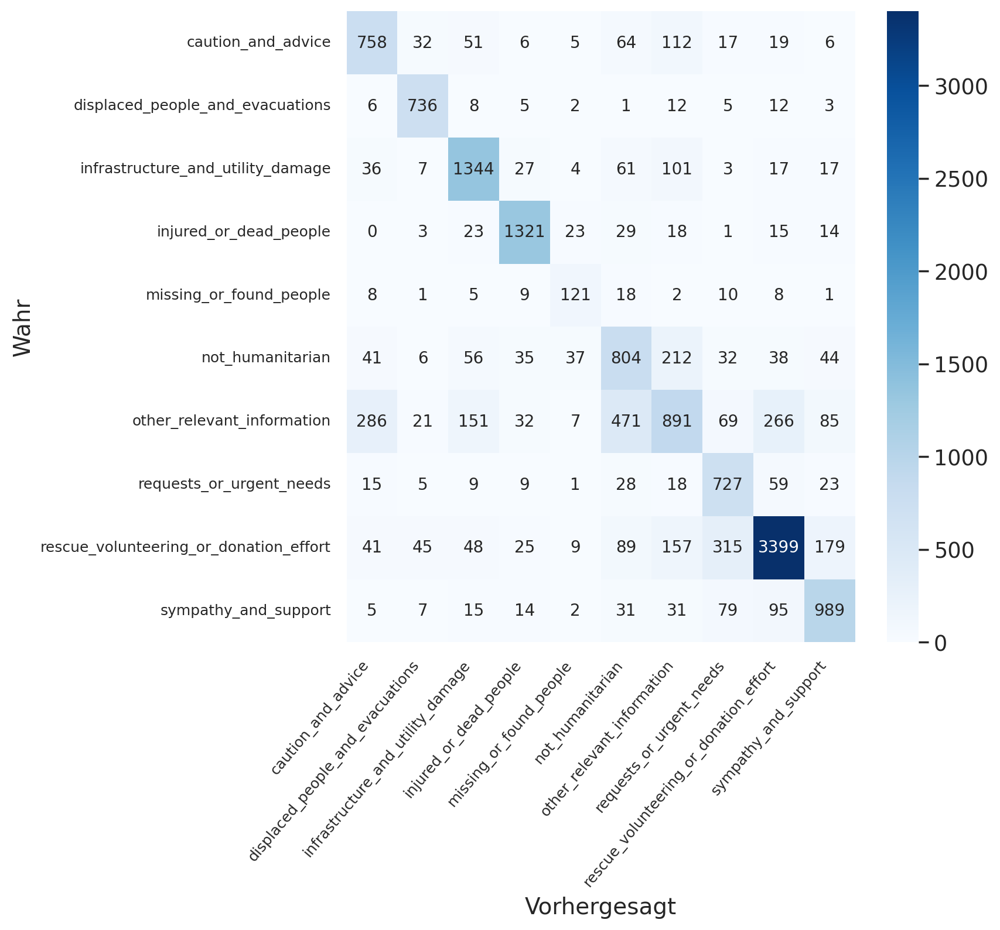

In [ ]:
show_disaster_tweet_prediction_distribution_general(merged_afterLV1_labels_numerical, merged_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

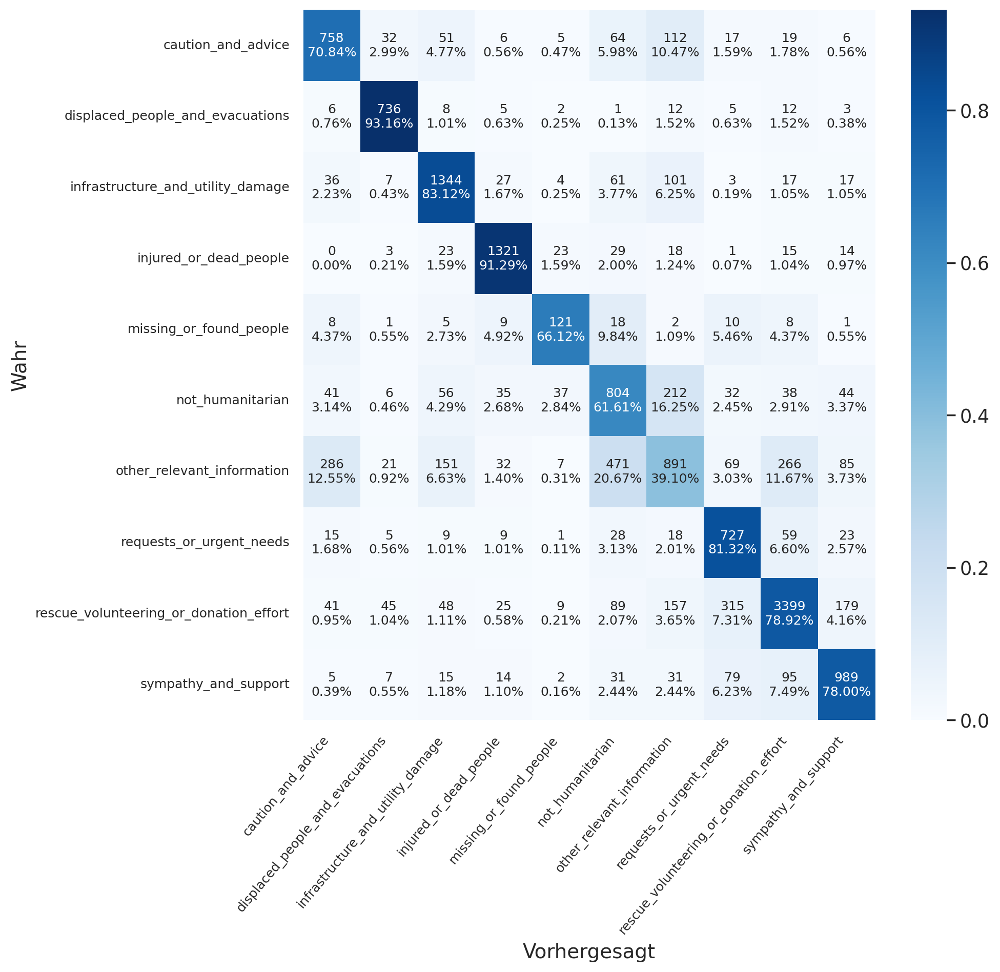

In [ ]:
show_disaster_tweet_prediction_distribution_detail(merged_afterLV1_labels_numerical, merged_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Modell β (LV1)



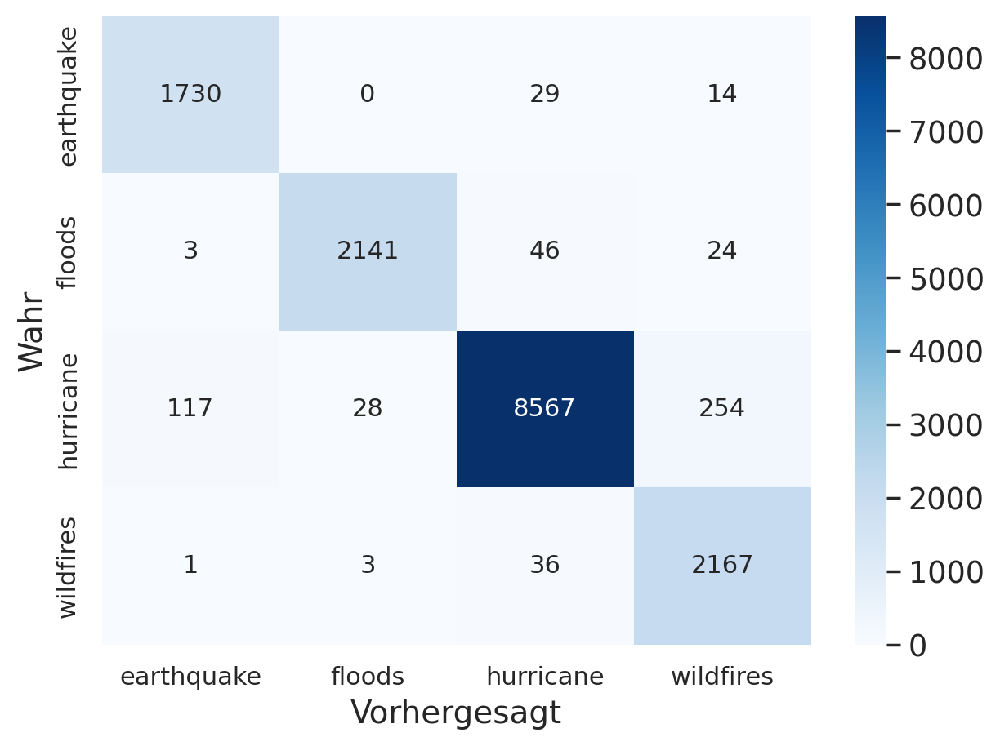

In [ ]:
show_disaster_tweet_prediction_distribution_general(lv1_labels_numerical, lv1_predictions_numerical, figsize_input_small, heatmap_fontsize_large, rotation_x_none, rotation_y_some, xylabels_fontsize_big, 'center', lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

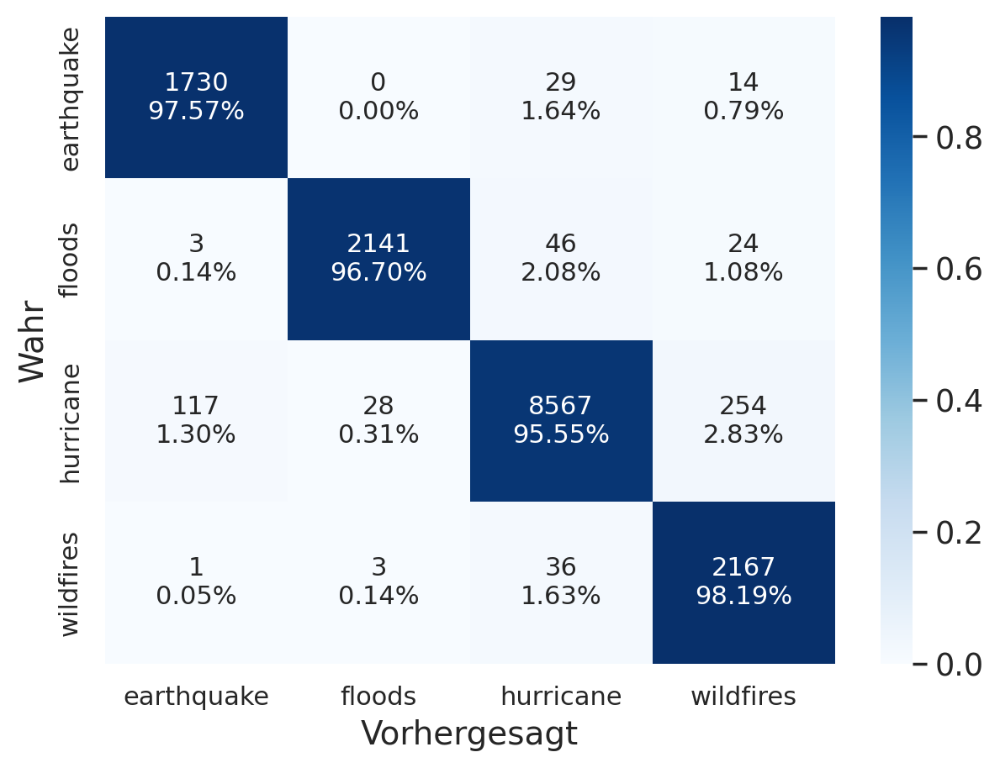

In [ ]:
show_disaster_tweet_prediction_distribution_detail(lv1_labels_numerical, lv1_predictions_numerical, figsize_input_small, labels_reshape_input_lv1, heatmap_fontsize_large, rotation_x_none, rotation_y_some, xylabels_fontsize_big, 'center', lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Modell γ(e) (EQU)

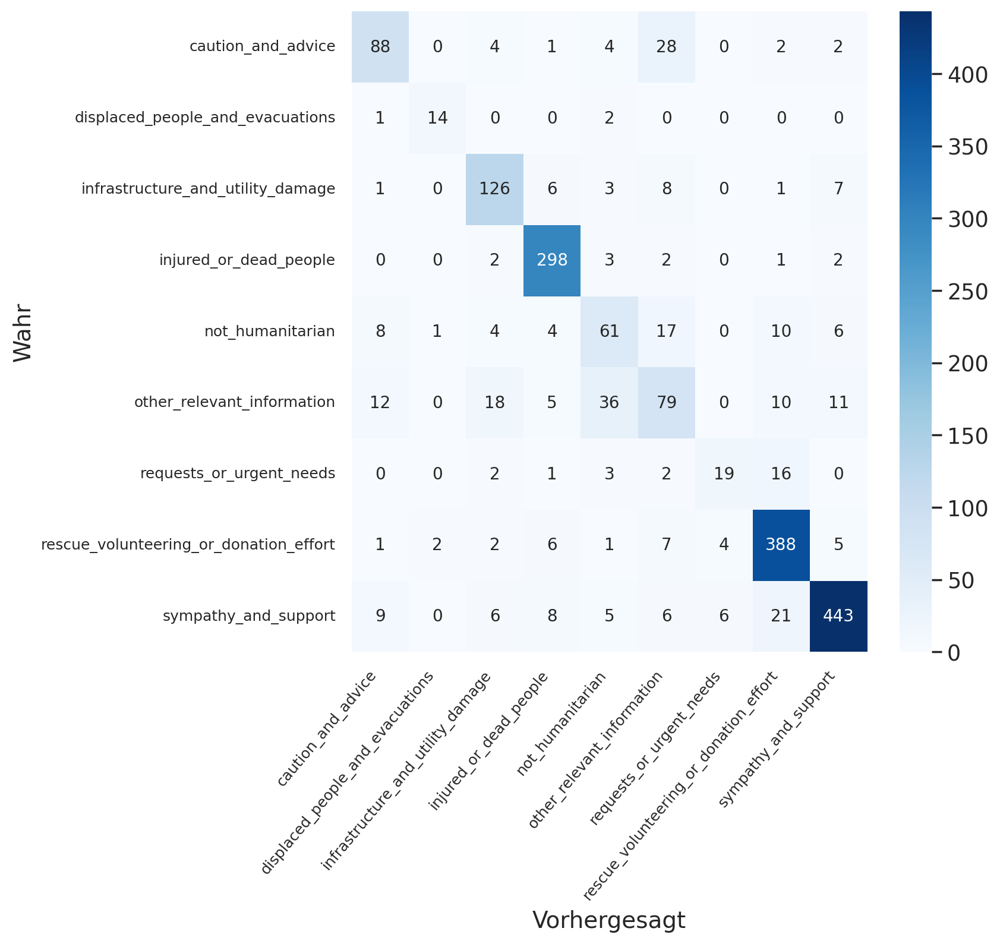

In [ ]:
show_disaster_tweet_prediction_distribution_general(equ_afterLV1_labels_numerical, equ_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', equ_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

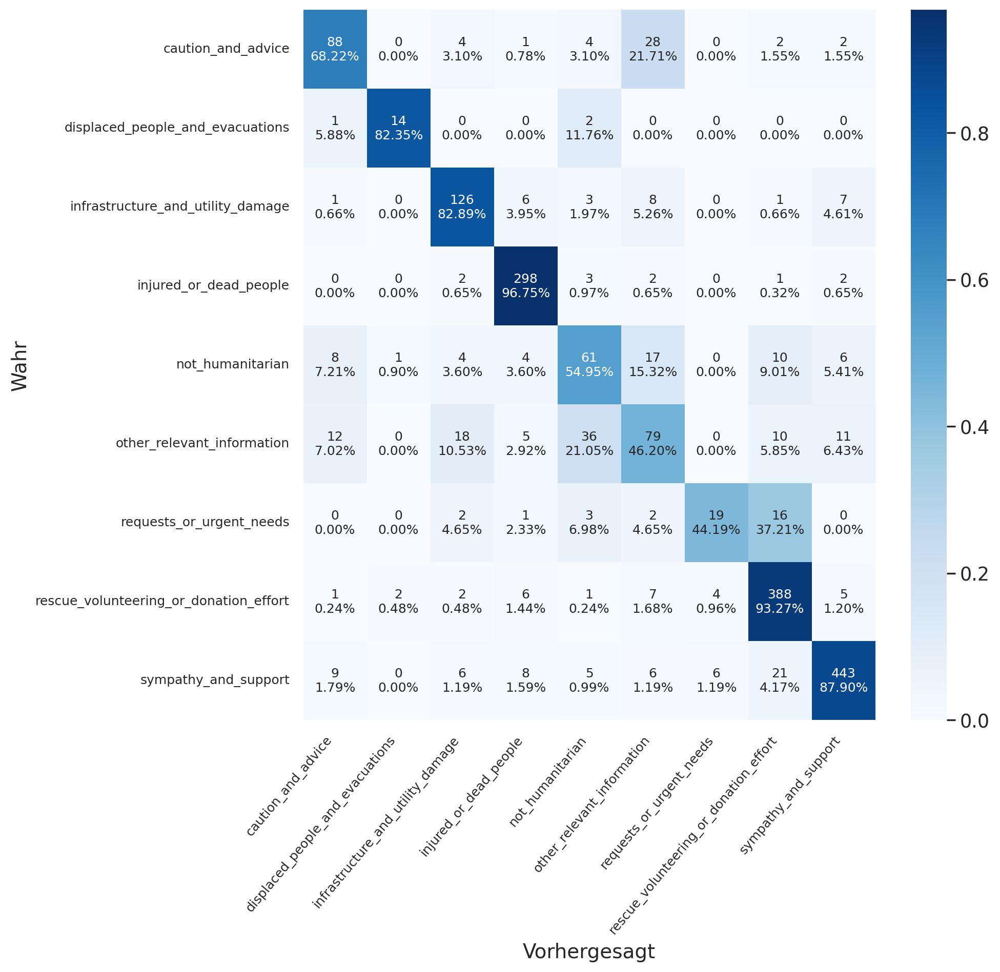

In [ ]:
show_disaster_tweet_prediction_distribution_detail(equ_afterLV1_labels_numerical, equ_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_equ, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', equ_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Modell γ(f) (FLD)

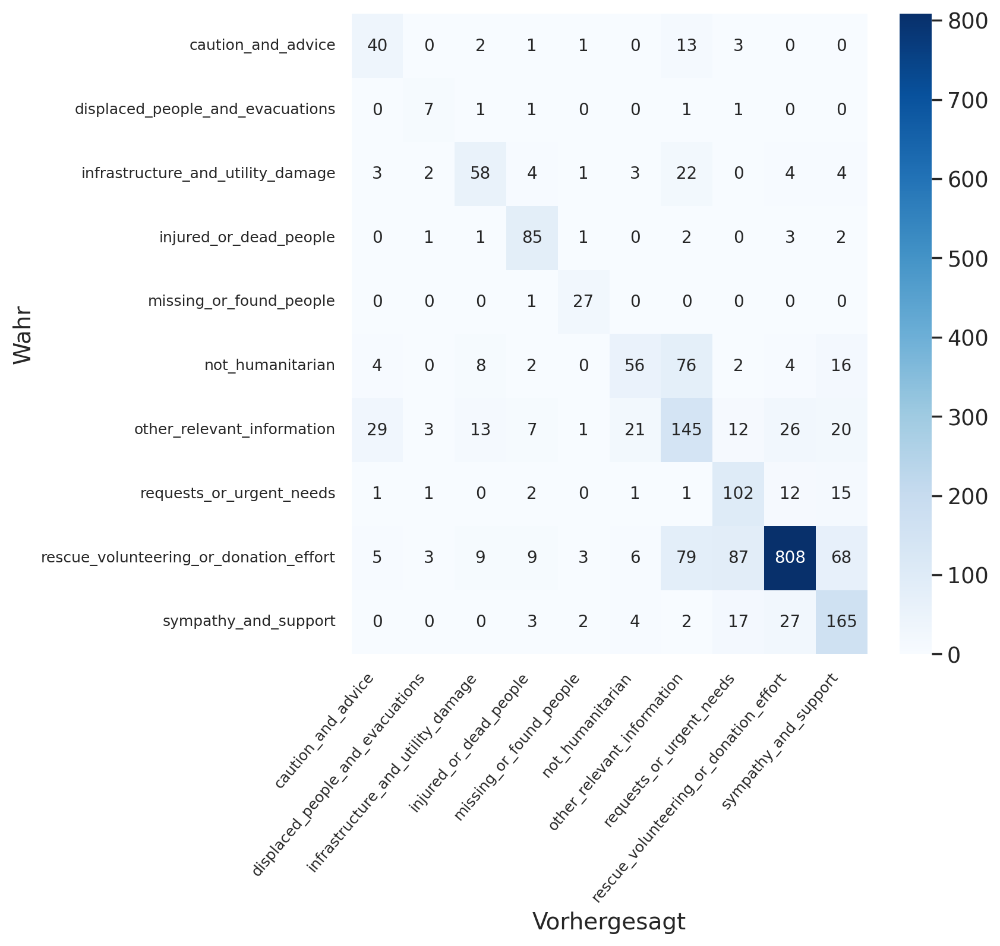

In [ ]:
show_disaster_tweet_prediction_distribution_general(fld_afterLV1_labels_numerical, fld_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

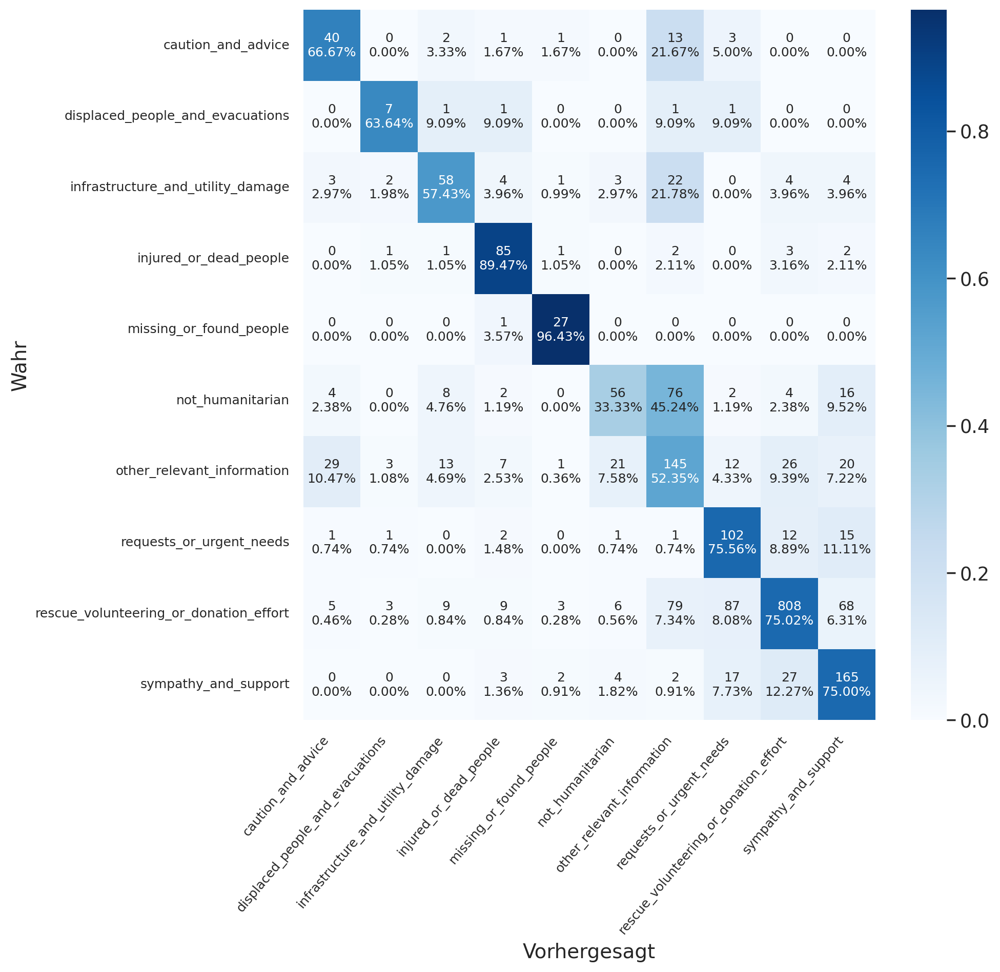

In [ ]:
show_disaster_tweet_prediction_distribution_detail(fld_afterLV1_labels_numerical, fld_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Modell γ(h) (HRC)

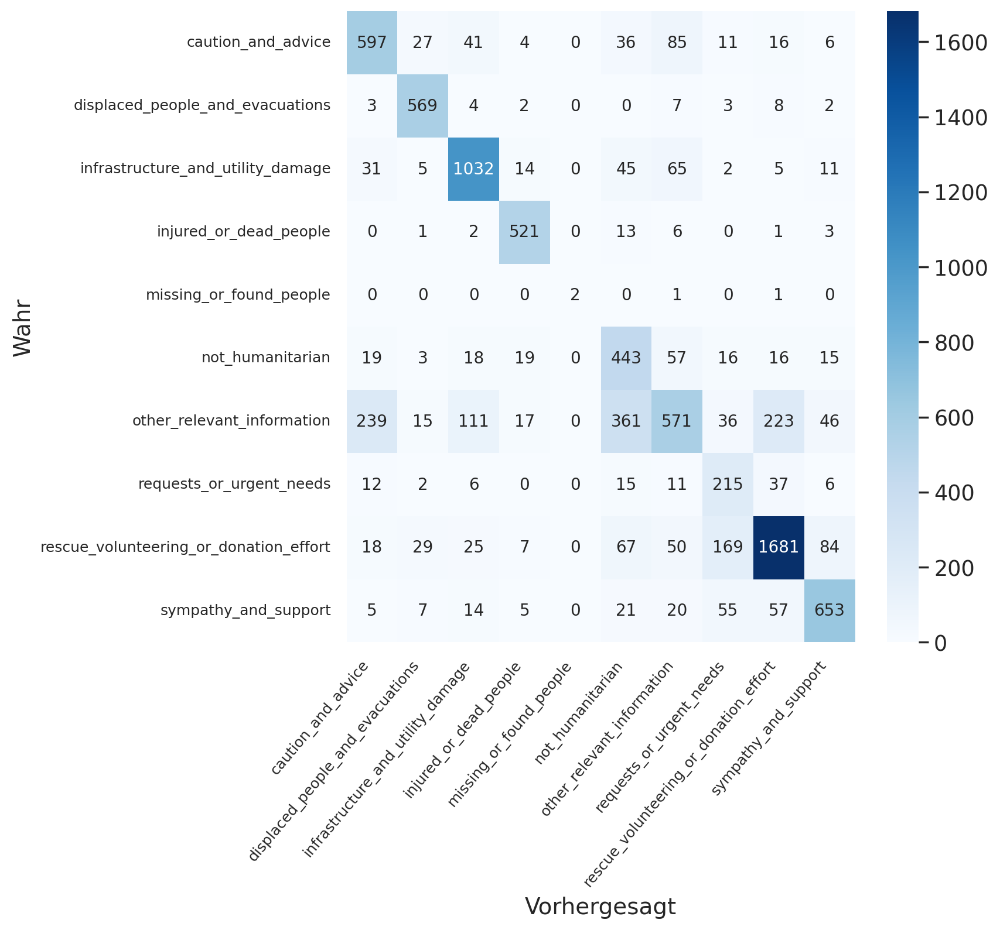

In [ ]:
show_disaster_tweet_prediction_distribution_general(hrc_afterLV1_labels_numerical, hrc_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

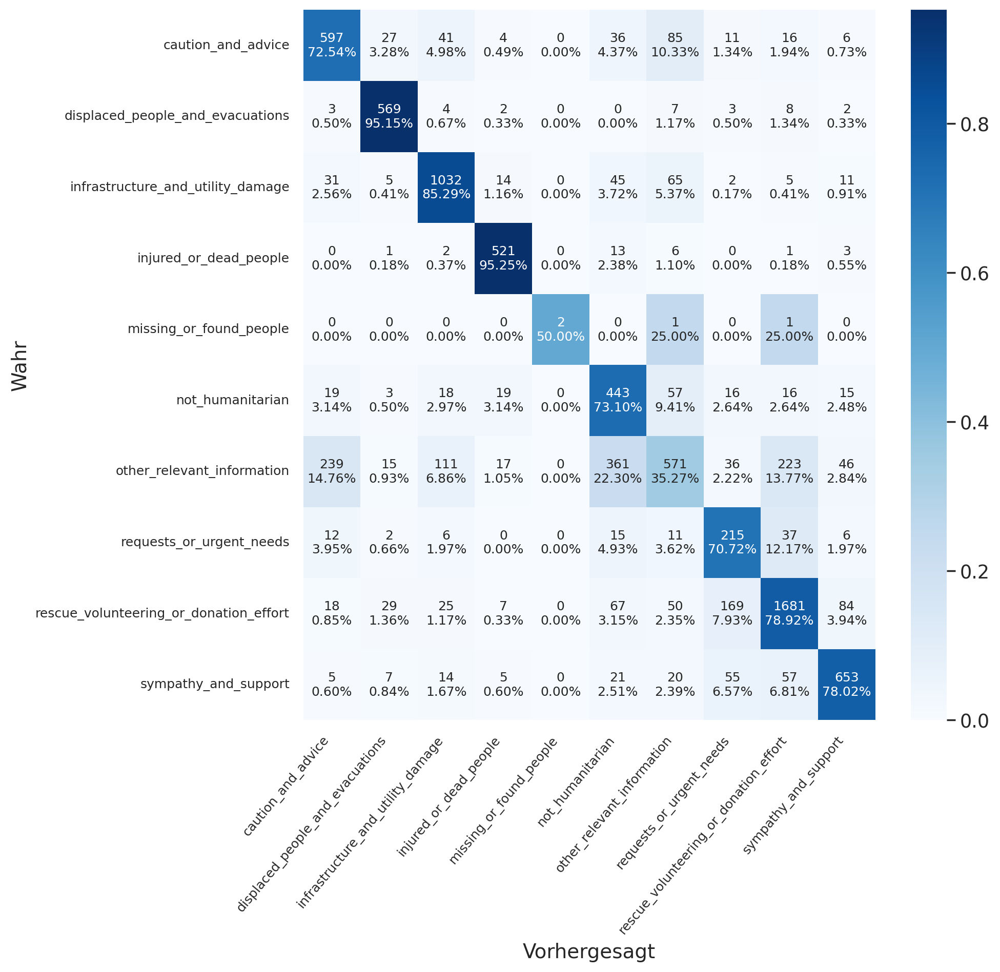

In [ ]:
show_disaster_tweet_prediction_distribution_detail(hrc_afterLV1_labels_numerical, hrc_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

### Modell γ(w) (WFR)

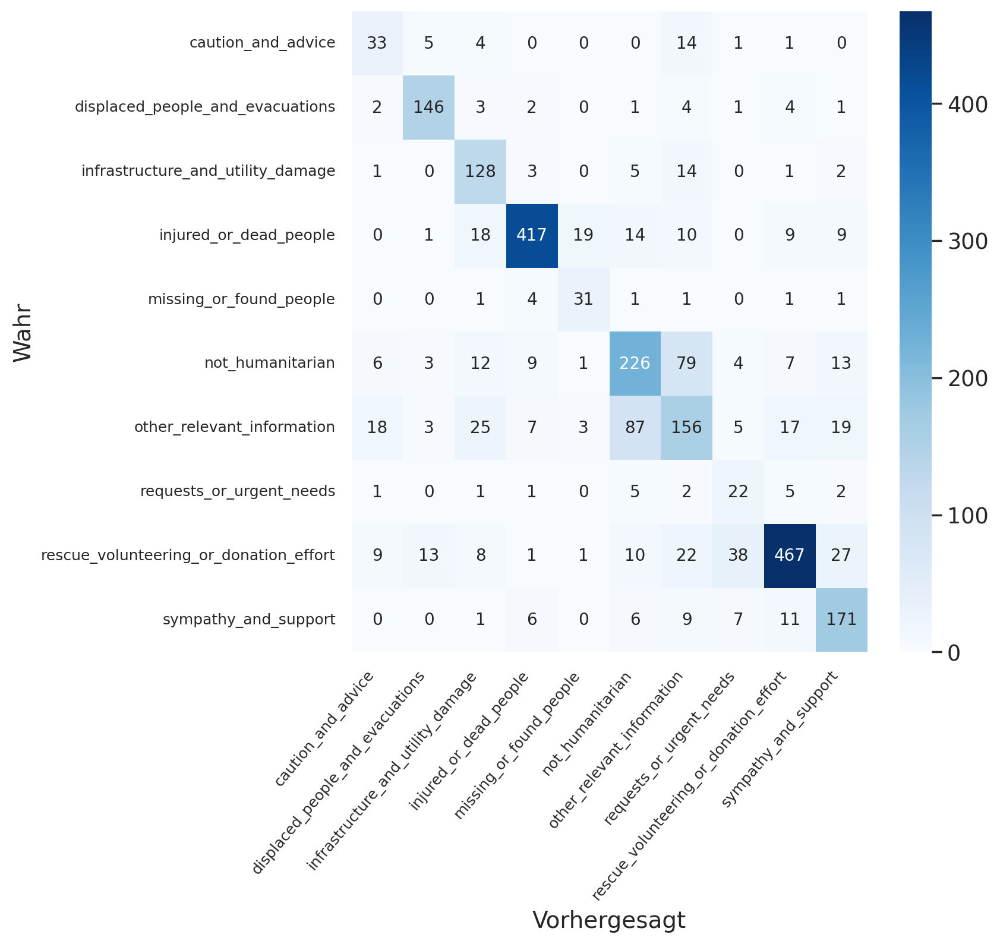

In [ ]:
show_disaster_tweet_prediction_distribution_general(wfr_afterLV1_labels_numerical, wfr_afterLV1_predictions_numerical, figsize_input_big, heatmap_fontsize_medium, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

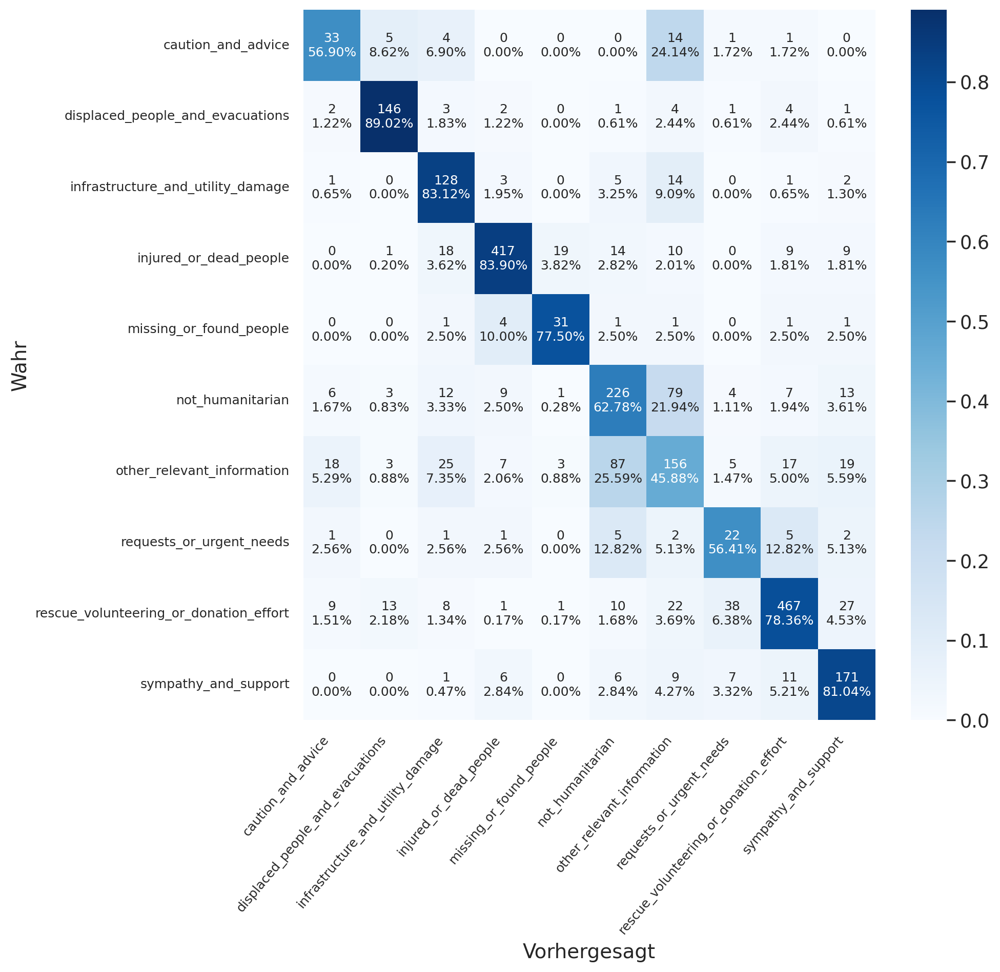

In [ ]:
show_disaster_tweet_prediction_distribution_detail(wfr_afterLV1_labels_numerical, wfr_afterLV1_predictions_numerical, figsize_input_verybig, labels_reshape_input_lv2, heatmap_fontsize_small, rotation_x_some, rotation_y_none, xylabels_fontsize_small, 'right', lv2_after_lv1_cm_class_names, mainlabels_fontsize, mainlabels_fontsize)

## Evaluation

### Genauigkeiten

In [ ]:
# Info: Generelle Genauigkeit Architekturart (a) mit Modell α
accuracy1_lv2 = MulticlassAccuracy(num_classes=10)
accuracy1_lv2(predictions_lv2, labels_lv2_numerical)

tensor(0.7666)

In [ ]:
# Info: Generelle Genauigkeit Architekturart (b) mit Modell β und Varianten von Modell γ
accuracy1 = MulticlassAccuracy(num_classes=10)
accuracy1(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor(0.6533)

In [ ]:
# Info: Generelle Genauigkeit Modell β
accuracy1_beta = MulticlassAccuracy(num_classes=4)
accuracy1_beta(predictions_lv1_numerical, labels_lv1_numerical)

tensor(0.9700)

In [ ]:
# Info: Generelle Genauigkeit Modell γ(e)
accuracy1_gamma_e = MulticlassAccuracy(num_classes=10)
accuracy1_gamma_e(equ_afterLV1_predictions_numerical, equ_afterLV1_labels_numerical)

tensor(0.6567)

In [ ]:
# Info: Generelle Genauigkeit Modell γ(f)
accuracy1_gamma_f = MulticlassAccuracy(num_classes=10)
accuracy1_gamma_f(fld_afterLV1_predictions_numerical, fld_afterLV1_labels_numerical)

tensor(0.6849)

In [ ]:
# Info: Generelle Genauigkeit Modell γ(h)
accuracy1_gamma_h = MulticlassAccuracy(num_classes=10)
accuracy1_gamma_h(hrc_afterLV1_predictions_numerical, hrc_afterLV1_labels_numerical)

tensor(0.7343)

In [ ]:
# Info: Generelle Genauigkeit Modell γ(w)
accuracy1_gamma_w = MulticlassAccuracy(num_classes=10)
accuracy1_gamma_w(wfr_afterLV1_predictions_numerical, wfr_afterLV1_labels_numerical)

tensor(0.7149)

In [ ]:
# Info: Genauigkeiten Architekturart (a) mit Modell α
accuracy2_lv2 = MulticlassAccuracy(num_classes=10, average=None)
accuracy2_lv2(predictions_lv2, labels_lv2_numerical)

tensor([0.7953, 0.9215, 0.8343, 0.9489, 0.8611, 0.6675, 0.3257, 0.5950, 0.8808,
        0.8358])

In [ ]:
# Info: Genauigkeiten Architekturart (b) mit Modell β und Varianten von Modell γ
accuracy2 = MulticlassAccuracy(num_classes=10, average=None)
accuracy2(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor([0.7084, 0.9316, 0.8312, 0.9129, 0.3279, 0.5831, 0.3835, 0.3837, 0.6912,
        0.7800])

In [ ]:
# Info: Genauigkeiten Modell β
accuracy2_beta = MulticlassAccuracy(num_classes=4, average=None)
accuracy2_beta(predictions_lv1, labels_lv1_numerical)

tensor([0.9757, 0.9670, 0.9555, 0.9819])

In [ ]:
# Info: Genauigkeiten Modell γ(e)
accuracy2_gamma_e = MulticlassAccuracy(num_classes=9, average=None)
accuracy2_gamma_e(equ_afterLV1_predictions, equ_afterLV1_labels_numerical)

tensor([0.6822, 0.8235, 0.8289, 0.9675, 0.5495, 0.4620, 0.4419, 0.9327, 0.8790])

In [ ]:
# Info: Genauigkeiten Modell γ(f)
accuracy2_gamma_f = MulticlassAccuracy(num_classes=10, average=None)
accuracy2_gamma_f(fld_afterLV1_predictions, fld_afterLV1_labels_numerical)

tensor([0.6667, 0.6364, 0.5743, 0.8947, 0.9643, 0.3333, 0.5235, 0.7556, 0.7502,
        0.7500])

In [ ]:
# Info: Genauigkeiten Modell γ(h)
accuracy2_gamma_h = MulticlassAccuracy(num_classes=10, average=None)
accuracy2_gamma_h(hrc_afterLV1_predictions, hrc_afterLV1_labels_numerical)

tensor([0.7254, 0.9515, 0.8529, 0.9525, 0.5000, 0.7310, 0.3527, 0.7072, 0.7892,
        0.7802])

In [ ]:
# Info: Genauigkeiten Modell γ(w)
accuracy2_gamma_w = MulticlassAccuracy(num_classes=10, average=None)
accuracy2_gamma_w(wfr_afterLV1_predictions, wfr_afterLV1_labels_numerical)

tensor([0.5690, 0.8902, 0.8312, 0.8390, 0.7750, 0.6278, 0.4588, 0.5641, 0.7836,
        0.8104])

### Aurocs

In [ ]:
# Info: Generelle AUROC Architekturart (a) mit Modell α
multi_auroc1_lv2 = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1_lv2(predictions_lv2, labels_lv2_numerical)

tensor(0.9652)

In [ ]:
# Info: Generelle AUROC Architekturart (b) mit Modell β und Varianten von Modell γ
multi_auroc1 = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor(0.8753)

In [ ]:
# Info: Generelle AUROC Modell β
multi_auroc1_beta = MulticlassAUROC(num_classes=4, average="macro", thresholds=None)
multi_auroc1_beta(predictions_lv1, labels_lv1_numerical)

tensor(0.9982)

In [ ]:
# Info: Generelle AUROC Modell γ(e)
multi_auroc1_gamma_e = MulticlassAUROC(num_classes=9, average="macro", thresholds=None)
multi_auroc1_gamma_e(equ_afterLV1_predictions, equ_afterLV1_labels_numerical)

tensor(0.9387)

In [ ]:
# Info: Generelle AUROC Modell γ(f)
multi_auroc1_gamma_f = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1_gamma_f(fld_afterLV1_predictions, fld_afterLV1_labels_numerical)

tensor(0.9276)

In [ ]:
# Info: Generelle AUROC Modell γ(h)
multi_auroc1_gamma_h = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1_gamma_h(hrc_afterLV1_predictions, hrc_afterLV1_labels_numerical)

tensor(0.9390)

In [ ]:
# Info: Generelle AUROC Modell γ(w)
multi_auroc1_gamma_w = MulticlassAUROC(num_classes=10, average="macro", thresholds=None)
multi_auroc1_gamma_w(wfr_afterLV1_predictions, wfr_afterLV1_labels_numerical)

tensor(0.9447)

In [ ]:
# Info: AUROCs Architekturart (a) mit Modell α
multi_auroc2_lv2 = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2_lv2(predictions_lv2, labels_lv2_numerical)

tensor([0.9671, 0.9935, 0.9803, 0.9969, 0.9963, 0.9435, 0.8757, 0.9499, 0.9735,
        0.9758])

In [ ]:
# Info: AUROCs Architekturart (b) mit Modell β und Varianten von Modell γ
multi_auroc2 = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2(merged_afterLV1_predictions, merged_afterLV1_labels_numerical)

tensor([0.9559, 0.9898, 0.9742, 0.9922, 0.4224, 0.9038, 0.8518, 0.8167, 0.9074,
        0.9393])

In [ ]:
# Info: AUROCs Architekturart Modell β
multi_auroc2_beta = MulticlassAUROC(num_classes=4, average=None, thresholds=None)
multi_auroc2_beta(predictions_lv1, labels_lv1_numerical)

tensor([0.9981, 0.9987, 0.9973, 0.9987])

In [ ]:
# Info: AUROCs Architekturart Modell γ(e)
multi_auroc2_gamma_e = MulticlassAUROC(num_classes=9, average=None, thresholds=None)
multi_auroc2_gamma_e(equ_afterLV1_predictions, equ_afterLV1_labels_numerical)

tensor([0.9595, 0.9062, 0.9650, 0.9883, 0.8863, 0.8872, 0.9047, 0.9812, 0.9696])

In [ ]:
# Info: AUROCs Architekturart Modell γ(f)
multi_auroc2_gamma_f = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2_gamma_f(fld_afterLV1_predictions, fld_afterLV1_labels_numerical)

tensor([0.9344, 0.8969, 0.9226, 0.9775, 0.9995, 0.9162, 0.8169, 0.9407, 0.9341,
        0.9367])

In [ ]:
# Info: AUROCs Architekturart Modell γ(h)
multi_auroc2_gamma_h = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2_gamma_h(hrc_afterLV1_predictions, hrc_afterLV1_labels_numerical)

tensor([0.9558, 0.9939, 0.9820, 0.9969, 0.7721, 0.9277, 0.8800, 0.9513, 0.9614,
        0.9689])

In [ ]:
# Info: AUROCs Architekturart Modell γ(w)
multi_auroc2_gamma_w = MulticlassAUROC(num_classes=10, average=None, thresholds=None)
multi_auroc2_gamma_w(wfr_afterLV1_predictions, wfr_afterLV1_labels_numerical)

tensor([0.9603, 0.9922, 0.9607, 0.9884, 0.9746, 0.9222, 0.8588, 0.8809, 0.9577,
        0.9515])

### Precision/Recall/F1/Support

In [ ]:
# Info: Evaluierungs-Report Architekturart (a) mit Modell α
y_pred_lv2 = predictions_lv2.numpy()
y_true_lv2 = labels_lv2.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_lv2 = np.where(y_pred_lv2 > THRESHOLD, upper, lower)

print(classification_report(
  y_true_lv2, 
  y_pred_lv2, 
  target_names=LABEL_COLUMNS_LV2, 
  zero_division=0
))

                                        precision    recall  f1-score   support

                    caution_and_advice       0.63      0.77      0.69      1070
      displaced_people_and_evacuations       0.87      0.91      0.89       790
     infrastructure_and_utility_damage       0.81      0.81      0.81      1617
                injured_or_dead_people       0.90      0.94      0.92      1447
               missing_or_found_people       0.66      0.86      0.75        72
                      not_humanitarian       0.59      0.60      0.60      1245
            other_relevant_information       0.68      0.24      0.36      2407
              requests_or_urgent_needs       0.63      0.51      0.56       521
rescue_volunteering_or_donation_effort       0.86      0.86      0.86      4219
                  sympathy_and_support       0.82      0.82      0.82      1772

                             micro avg       0.79      0.72      0.75     15160
                             macro avg

In [ ]:
# Info: Evaluierungs-Report Architekturart (b) mit Modell β und Varianten von Modell γ
y_pred = merged_afterLV1_predictions.numpy()
y_true = merged_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred = np.where(y_pred > THRESHOLD, upper, lower)

classification_report_lv1 = classification_report(
    y_true, 
    y_pred, 
    target_names=LABEL_COLUMNS_LV2, 
    zero_division=0)

print(classification_report_lv1)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.68      0.67      0.68      1070
      displaced_people_and_evacuations       0.86      0.92      0.89       790
     infrastructure_and_utility_damage       0.81      0.81      0.81      1617
                injured_or_dead_people       0.90      0.90      0.90      1447
               missing_or_found_people       0.66      0.82      0.73        72
                      not_humanitarian       0.54      0.57      0.56      1245
            other_relevant_information       0.61      0.26      0.37      2407
              requests_or_urgent_needs       0.48      0.65      0.55       521
rescue_volunteering_or_donation_effort       0.88      0.74      0.80      4219
                  sympathy_and_support       0.82      0.78      0.80      1772

                             micro avg       0.77      0.68      0.72     15160
                             macro avg

In [ ]:
# Info: Evaluierungs-Report Modell β labels_lv1_numerical
y_pred_beta = predictions_lv1.numpy()
y_true_beta = labels_lv1.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_beta = np.where(y_pred_beta > THRESHOLD, upper, lower)

classification_report_beta = classification_report(
    y_true_beta, 
    y_pred_beta, 
    target_names=LABEL_COLUMNS_LV1, 
    zero_division=0)

print(classification_report_beta)

              precision    recall  f1-score   support

  earthquake       0.94      0.97      0.96      1773
      floods       0.99      0.96      0.98      2214
   hurricane       0.99      0.95      0.97      8966
   wildfires       0.90      0.98      0.94      2207

   micro avg       0.97      0.96      0.96     15160
   macro avg       0.96      0.97      0.96     15160
weighted avg       0.97      0.96      0.96     15160
 samples avg       0.96      0.96      0.96     15160



In [ ]:
# Info: Evaluierungs-Report Modell γ(e)
y_pred_gamma_e = equ_afterLV1_predictions.numpy()
y_true_gamma_e = equ_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_gamma_e = np.where(y_pred_gamma_e > THRESHOLD, upper, lower)

classification_report_gamma_e = classification_report(
    y_true_gamma_e, 
    y_pred_gamma_e, 
    target_names=LABEL_COLUMNS_LV2_EQU, 
    zero_division=0)

print(classification_report_gamma_e)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.76      0.67      0.71       129
      displaced_people_and_evacuations       0.82      0.82      0.82        17
     infrastructure_and_utility_damage       0.80      0.81      0.81       152
                injured_or_dead_people       0.91      0.97      0.94       308
                      not_humanitarian       0.58      0.42      0.49       111
            other_relevant_information       0.60      0.35      0.44       171
              requests_or_urgent_needs       0.65      0.40      0.49        43
rescue_volunteering_or_donation_effort       0.88      0.92      0.90       416
                  sympathy_and_support       0.93      0.87      0.90       504

                             micro avg       0.85      0.79      0.82      1851
                             macro avg       0.77      0.69      0.72      1851
                          weighted avg

In [ ]:
# Info: Evaluierungs-Report Modell γ(f)
y_pred_gamma_f = fld_afterLV1_predictions.numpy()
y_true_gamma_f = fld_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_gamma_f = np.where(y_pred_gamma_f > THRESHOLD, upper, lower)

classification_report_gamma_f = classification_report(
    y_true_gamma_f, 
    y_pred_gamma_f, 
    target_names=LABEL_COLUMNS_LV2, 
    zero_division=0)

print(classification_report_gamma_f)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.56      0.65      0.60        60
      displaced_people_and_evacuations       0.38      0.45      0.42        11
     infrastructure_and_utility_damage       0.71      0.54      0.62       101
                injured_or_dead_people       0.76      0.88      0.82        95
               missing_or_found_people       0.79      0.96      0.87        28
                      not_humanitarian       0.59      0.25      0.35       168
            other_relevant_information       0.45      0.38      0.41       277
              requests_or_urgent_needs       0.51      0.74      0.60       135
rescue_volunteering_or_donation_effort       0.93      0.71      0.80      1077
                  sympathy_and_support       0.63      0.73      0.68       220

                             micro avg       0.73      0.64      0.68      2172
                             macro avg

In [ ]:
# Info: Evaluierungs-Report Modell γ(h)
y_pred_gamma_h = hrc_afterLV1_predictions.numpy()
y_true_gamma_h = hrc_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_gamma_h = np.where(y_pred_gamma_h > THRESHOLD, upper, lower)

classification_report_gamma_h = classification_report(
    y_true_gamma_h, 
    y_pred_gamma_h, 
    target_names=LABEL_COLUMNS_LV2, 
    zero_division=0)

print(classification_report_gamma_h)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.69      0.68      0.69       823
      displaced_people_and_evacuations       0.87      0.94      0.91       598
     infrastructure_and_utility_damage       0.84      0.84      0.84      1210
                injured_or_dead_people       0.90      0.94      0.92       547
               missing_or_found_people       1.00      0.50      0.67         4
                      not_humanitarian       0.48      0.68      0.57       606
            other_relevant_information       0.70      0.20      0.32      1619
              requests_or_urgent_needs       0.49      0.66      0.56       304
rescue_volunteering_or_donation_effort       0.85      0.71      0.77      2130
                  sympathy_and_support       0.85      0.74      0.79       837

                             micro avg       0.77      0.66      0.71      8678
                             macro avg

In [ ]:
# Info: Evaluierungs-Report Modell γ(w)
y_pred_gamma_w = wfr_afterLV1_predictions.numpy()
y_true_gamma_w = wfr_afterLV1_labels.numpy()

upper, lower = 1, 0
THRESHOLD = 0.5

y_pred_gamma_w = np.where(y_pred_gamma_w > THRESHOLD, upper, lower)

classification_report_gamma_w = classification_report(
    y_true_gamma_w, 
    y_pred_gamma_w, 
    target_names=LABEL_COLUMNS_LV2, 
    zero_division=0)

print(classification_report_gamma_w)

                                        precision    recall  f1-score   support

                    caution_and_advice       0.52      0.57      0.55        58
      displaced_people_and_evacuations       0.87      0.87      0.87       164
     infrastructure_and_utility_damage       0.65      0.82      0.73       154
                injured_or_dead_people       0.95      0.82      0.88       497
               missing_or_found_people       0.56      0.75      0.64        40
                      not_humanitarian       0.67      0.59      0.63       360
            other_relevant_information       0.57      0.40      0.47       340
              requests_or_urgent_needs       0.30      0.54      0.39        39
rescue_volunteering_or_donation_effort       0.91      0.76      0.83       596
                  sympathy_and_support       0.74      0.76      0.75       211

                             micro avg       0.77      0.70      0.73      2459
                             macro avg

## Testen mit eigenem Test-Kommentar

In [ ]:
'''
# Info: Testen mit Test-Kommentar

test_comment = "Of the 23 people killed by the fire in Paradise, California, 6 died in cars."

encoding = tokenizer.encode_plus(
  test_comment,
  add_special_tokens=True,
  max_length=512,
  return_token_type_ids=False,
  padding="max_length",
  return_attention_mask=True,
  return_tensors='pt',
)

_, test_prediction =trained_model_lv1(encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().numpy()

for label, prediction in zip(LABEL_COLUMNS_LV1, test_prediction):
  print(f"{label}: {prediction}")
'''

earthquake: 0.025412052869796753
floods: 0.04435795173048973
hurricane: 0.21904456615447998
wildfires: 0.5544158220291138


In [ ]:
'''
# Info: Testen mit Test-Kommentar

THRESHOLD = 0.5

#test_comment = "I can't find my sister, has anyone seen her?"
#test_comment = "I want to spend all my money and donate to help these people"
test_comment = "My thoughts are with all the miserable people in the affected region"
encoding = tokenizer.encode_plus(
  test_comment,
  add_special_tokens=True,
  max_length=512,
  return_token_type_ids=False,
  padding="max_length",
  return_attention_mask=True,
  return_tensors='pt',
)

_, test_prediction = trained_model_lv1(encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().numpy()

for label, prediction in zip(LABEL_COLUMNS_LV1, test_prediction):
  if prediction < THRESHOLD:
    continue
  print(f"{label}: {prediction}")
'''

sympathy_and_support: 0.9531278610229492
